In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
import sys
sys.path.append('../src/')

In [3]:
# set plotting params
import matplotlib as mpl
import plots
mpl.rcParams.update(mpl.rcParamsDefault)
plt.style.reload_library()
rcparams = plots.stdrcparams()
mpl.rcParams.update(rcparams)

from preprocess import *

In [4]:
import itertools
import plotly.graph_objects as go
from scipy.stats import linregress, entropy
from sklearn.datasets import make_classification
from sklearn.metrics import silhouette_score, adjusted_rand_score, mutual_info_score, adjusted_mutual_info_score, normalized_mutual_info_score
from sklearn.metrics.cluster import contingency_matrix
from sklearn.preprocessing import MinMaxScaler, StandardScaler, KBinsDiscretizer, RobustScaler
from sklearn.decomposition import PCA
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer, KNNImputer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture

In [5]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 30)

In [6]:
carpediem_dir = r'../data/carpediem'
curated_dir = r'../data/curated'
mimic_dir = r'../data/mimiciv_included'
dp_dir = r'../data/calculated/dp'

# script

In [7]:
dfs = []
for filename in os.listdir(os.path.join(dp_dir, '240521_holdout')):
    if filename.startswith('carpediem')&('CarryLastForward_limit2_' in filename):
        parts = filename.replace('carpediem_', '').replace('CarryLastForward_limit2_', '').replace('.csv', '').split('_')
        # print(parts)
        feature_set = parts[0]
        scaler_name = parts[1]
        n_pc = parts[2].replace('PC', '')
        boot = parts[-1].replace('boot', '').replace('pdist', 'all')

        file_path = os.path.join(dp_dir, '240521_holdout', filename)

        df = pd.read_csv(file_path, index_col=0)
        df['dataset'] = 'carpediem'
        df['feature_set'] = feature_set
        df['n_pc'] = n_pc
        df['boot'] = boot

        dfs.append(df)
        # break
    # break


In [8]:
dps = pd.concat(dfs, ignore_index=True)
# dps.drop(columns=['index'], inplace=True)

## feature sets

### sofs

In [9]:
feature_set = 'sofs'
num_pc = 2

data, _ = load_and_prepare_dataset(dataset='carpediem', feature_set=feature_set, \
                                imputation_strategy='CarryLastForward_limit2', scaler_name='KBD', holdout=.1)
pca = PCA(n_components=num_pc)
pcaX = pca.fit_transform(data.iloc[:,:-1])

loadings = pca.components_
pc_list = ["PC"+str(i) for i in list(range(1, num_pc+1))]
pcaX = pd.DataFrame(pcaX, columns=pc_list, index=data.index)
loadings = pd.DataFrame.from_dict(dict(zip(pc_list, loadings)))
loadings['variable'] = data.iloc[:,:-1].columns.values
loadings = loadings.set_index('variable')

top_features = {}
for pc in pc_list:
    sorted_loadings = loadings[pc].abs().sort_values(ascending=False)
    top_features[pc] = sorted_loadings.head(5).index.tolist()

In [10]:
top_features

{'PC1': ['GCS_motor_response',
  'GCS_eye_opening',
  'GCS_verbal_response',
  'htn_points',
  'P_F_ratio_points'],
 'PC2': ['renal_points',
  'platelet_points',
  'htn_points',
  'bilirubin_points',
  'GCS_motor_response']}

In [11]:
top_features_combined = [
    'GCS_motor_response', 
    'GCS_eye_opening',
    'GCS_verbal_response',
    'renal_points',
    'platelet_points',
]

Text(11.27777777777776, 0.5, '')

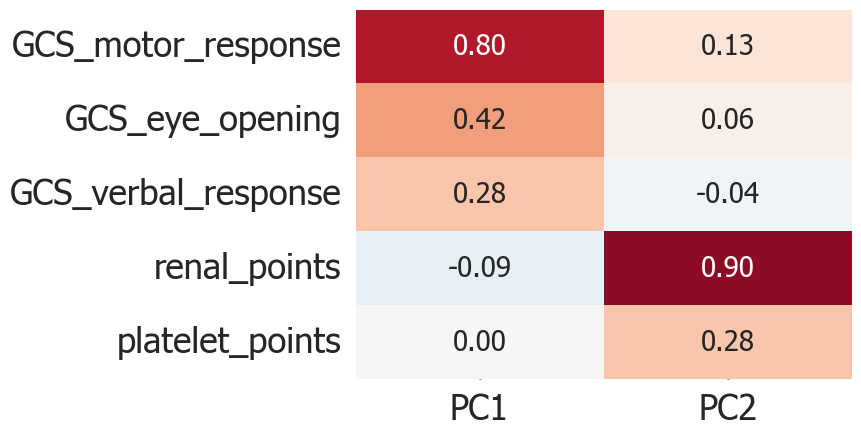

In [12]:
sns.heatmap(
    loadings.loc[top_features_combined, pc_list[:max(4, num_pc)]], 
    annot=True, cmap='RdBu_r', annot_kws={'size': 20}, fmt='.2f', 
    center=0, cbar_kws={'label': 'Loading'}, vmax=1, vmin=-1, cbar=False
)
plt.ylabel('')

In [13]:
f1 = dps.feature_set == 'sofs'
f2 = dps.boot == 'all'
sls = []
for n_cmp in np.arange(2,15):
    cc = dps[f1].sort_values('rd', ascending=False).iloc[:n_cmp*101,3:5]
    cc = cc.drop_duplicates()
    kms = [KMeans(n_clusters=nn, random_state=0, n_init=5).fit(cc.values) for nn in np.arange(2,min(15, len(cc)))]
    sls.append([silhouette_score(cc, km.labels_) for km in kms])
    # break

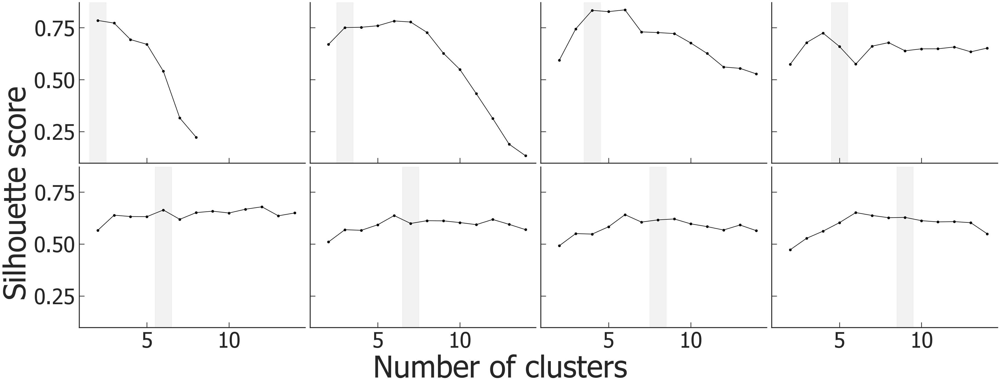

In [14]:
nc = 4
nr = 2
fig, axs = plt.subplots(nr, nc, figsize=plots.stdfigsize(nx=nc, ny=nr), constrained_layout=True, sharex=True, sharey=True)

for i in range(nr*nc):
    axs[i//nc, i%nc].plot(np.arange(2,len(sls[i])+2), sls[i], marker='o', color='k')
    axs[i//nc, i%nc].axvspan(i+1.5,i+2.5, color='gray', alpha=0.1)
    axs[i//nc, i%nc].tick_params(axis='both', which='major', labelsize=56)

fig.supxlabel('Number of clusters', ha='center', fontsize=80)
fig.supylabel('Silhouette score', va='center', fontsize=80)
plt.show()

In [15]:
n_cmp = 4
cc = dps[f1].sort_values('rd', ascending=False).iloc[:n_cmp*101,3:5]
kms = KMeans(n_clusters=n_cmp, random_state=0, n_init=5).fit(cc.values)

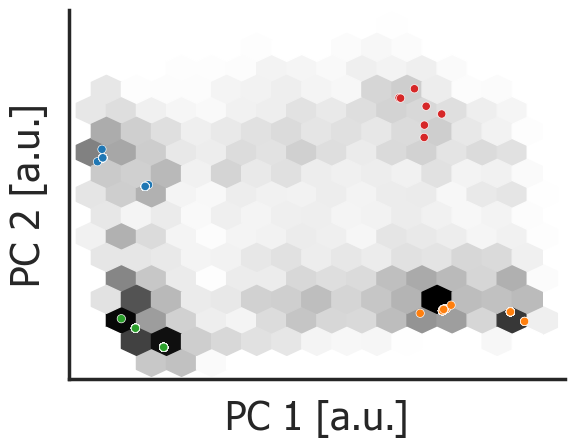

In [16]:
f1 = dps.feature_set == 'sofs'
f2 = dps.boot=='all'
# plt.figure(figsize=plots.stdfigsize(nx=1, ratio=1))
plt.hexbin(dps[f1 & f2].loc[:,'PC1'], dps[f1 & f2].loc[:,'PC2'], cmap='gray_r', zorder=1, gridsize=15)
sns.scatterplot(data=cc, x='PC1', y='PC2', hue=kms.labels_, zorder=2, legend=False, palette='tab10')
plt.xticks([])
plt.yticks([])
plt.xlabel('PC 1 [a.u.]')
plt.ylabel('PC 2 [a.u.]')
plt.show()

### sofs+vtls

In [17]:
feature_set = 'sofs+vtls'
num_pc = 4

data, _ = load_and_prepare_dataset(dataset='carpediem', feature_set=feature_set, \
                                imputation_strategy='CarryLastForward_limit2', scaler_name='KBD', holdout=.1)
pca = PCA(n_components=num_pc)
pcaX = pca.fit_transform(data.iloc[:,:-1])

loadings = pca.components_
pc_list = ["PC"+str(i) for i in list(range(1, num_pc+1))]
pcaX = pd.DataFrame(pcaX, columns=pc_list, index=data.index)
loadings = pd.DataFrame.from_dict(dict(zip(pc_list, loadings)))
loadings['variable'] = data.iloc[:,:-1].columns.values
loadings = loadings.set_index('variable')

top_features = {}
for pc in pc_list:
    sorted_loadings = loadings[pc].abs().sort_values(ascending=False)
    top_features[pc] = sorted_loadings.head(5).index.tolist()

In [18]:
top_features

{'PC1': ['GCS_motor_response',
  'GCS_eye_opening',
  'htn_points',
  'Diastolic_blood_pressure',
  'GCS_verbal_response'],
 'PC2': ['renal_points',
  'GCS_motor_response',
  'Mean_arterial_pressure',
  'Diastolic_blood_pressure',
  'Temperature'],
 'PC3': ['renal_points',
  'Systolic_blood_pressure',
  'GCS_motor_response',
  'Mean_arterial_pressure',
  'htn_points'],
 'PC4': ['Heart_rate',
  'Respiratory_rate',
  'Oxygen_saturation',
  'renal_points',
  'Temperature']}

In [19]:
top_features_combined = [
    'GCS_motor_response', 
    'htn_points',
    'renal_points',
    'Systolic_blood_pressure',
    'Heart_rate',
    'Respiratory_rate'
]

Text(11.27777777777776, 0.5, '')

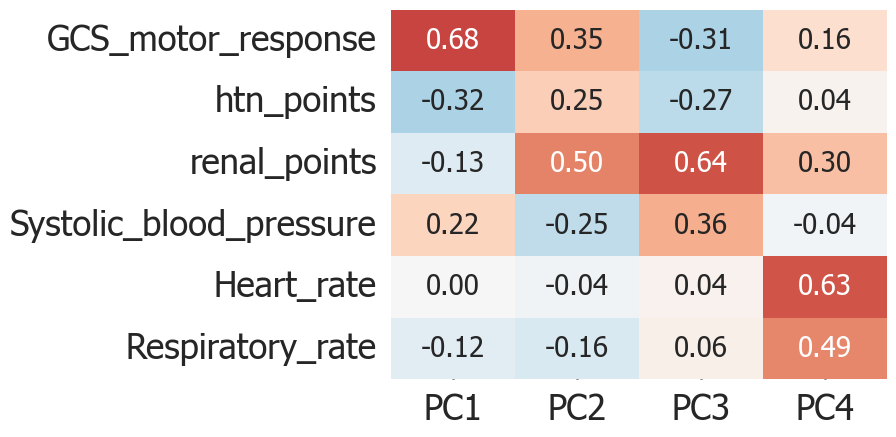

In [20]:
sns.heatmap(
    loadings.loc[top_features_combined, pc_list[:max(4, num_pc)]], 
    annot=True, cmap='RdBu_r', annot_kws={'size': 20}, fmt='.2f',
    center=0, cbar_kws={'label': 'Loading'}, vmax=1, vmin=-1, cbar=False
)
plt.ylabel('')

In [21]:
f1 = dps.feature_set == 'sofs+vtls'
sls = []
for n_cmp in np.arange(2,15):
    cc = dps[f1].sort_values('rd', ascending=False).iloc[:n_cmp*101,3:7]
    cc = cc.drop_duplicates()
    kms = [KMeans(n_clusters=nn, random_state=0, n_init=5).fit(cc.values) for nn in np.arange(2,min(15, len(cc)))]
    sls.append([silhouette_score(cc, km.labels_) for km in kms])

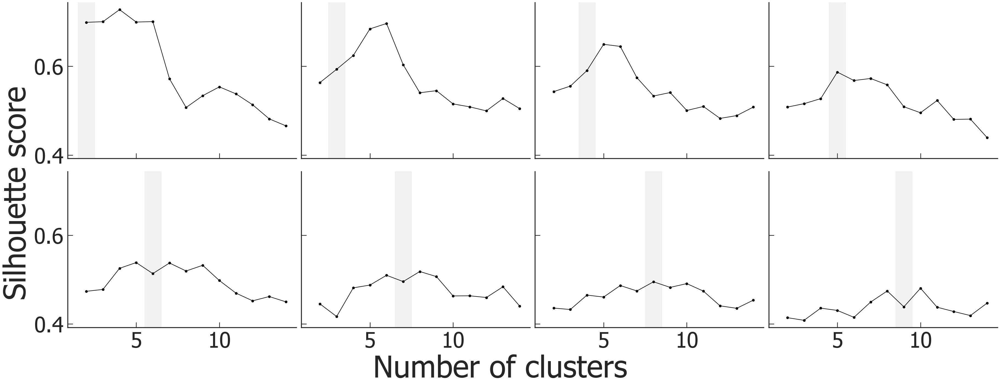

In [22]:
nc = 4
nr = 2
fig, axs = plt.subplots(nr, nc, figsize=plots.stdfigsize(nx=nc, ny=nr), constrained_layout=True, sharex=True, sharey=True)

for i in range(nr*nc):
    axs[i//nc, i%nc].plot(np.arange(2,len(sls[i])+2), sls[i], marker='o', color='k')
    axs[i//nc, i%nc].axvspan(i+1.5,i+2.5, color='gray', alpha=0.1)
    axs[i//nc, i%nc].tick_params(axis='both', which='major', labelsize=56)

fig.supxlabel('Number of clusters', ha='center', fontsize=80)
fig.supylabel('Silhouette score', va='center', fontsize=80)
plt.show()

In [23]:
n_cmp = 5
cc = dps[f1].sort_values('rd', ascending=False).iloc[:n_cmp*101,3:7]
kms = KMeans(n_clusters=n_cmp, random_state=0, n_init=5).fit(cc.values)

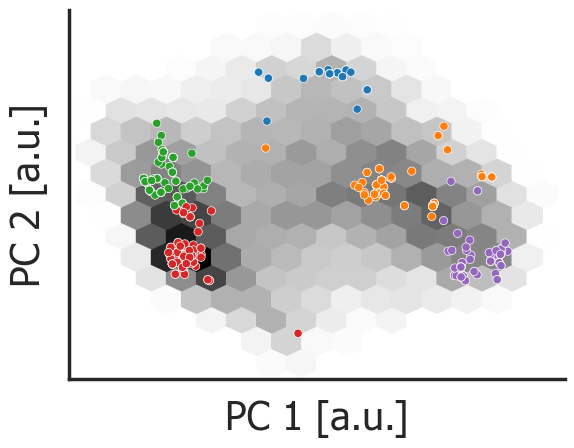

In [24]:
f1 = dps.feature_set == 'sofs+vtls'
f2 = dps.boot=='all'
plt.hexbin(dps[f1 & f2].loc[:,'PC1'], dps[f1 & f2].loc[:,'PC2'], cmap='gray_r', zorder=1, gridsize=15)
sns.scatterplot(data=cc, x='PC1', y='PC2', hue=kms.labels_, zorder=2, legend=False, palette='tab10')
plt.xticks([])
plt.yticks([])
plt.xlabel('PC 1 [a.u.]')
plt.ylabel('PC 2 [a.u.]')
plt.show()

### sofs+vtls+dmos1

In [25]:
feature_set = 'sofs+vtls+dmos1'
num_pc = 5

data, _ = load_and_prepare_dataset(dataset='carpediem', feature_set=feature_set, \
                                imputation_strategy='CarryLastForward_limit2', scaler_name='KBD', holdout=.1)
pca = PCA(n_components=num_pc)
pcaX = pca.fit_transform(data.iloc[:,:-1])

loadings = pca.components_
pc_list = ["PC"+str(i) for i in list(range(1, num_pc+1))]
pcaX = pd.DataFrame(pcaX, columns=pc_list, index=data.index)
loadings = pd.DataFrame.from_dict(dict(zip(pc_list, loadings)))
loadings['variable'] = data.iloc[:,:-1].columns.values
loadings = loadings.set_index('variable')

top_features = {}
for pc in pc_list:
    sorted_loadings = loadings[pc].abs().sort_values(ascending=False)
    top_features[pc] = sorted_loadings.head(5).index.tolist()

In [26]:
top_features

{'PC1': ['GCS_motor_response',
  'GCS_eye_opening',
  'htn_points',
  'Diastolic_blood_pressure',
  'GCS_verbal_response'],
 'PC2': ['renal_points',
  'Mean_arterial_pressure',
  'GCS_motor_response',
  'Diastolic_blood_pressure',
  'Temperature'],
 'PC3': ['renal_points',
  'Systolic_blood_pressure',
  'htn_points',
  'GCS_motor_response',
  'Diastolic_blood_pressure'],
 'PC4': ['Heart_rate',
  'Respiratory_rate',
  'Oxygen_saturation',
  'Temperature',
  'renal_points'],
 'PC5': ['Age',
  'Respiratory_rate',
  'platelet_points',
  'BMI',
  'Systolic_blood_pressure']}

In [27]:
top_features_combined = [
    'GCS_motor_response', 
    'htn_points',
    'renal_points',
    'Systolic_blood_pressure',
    'Heart_rate',
    'Respiratory_rate', 
    'Age'
]

Text(11.27777777777776, 0.5, '')

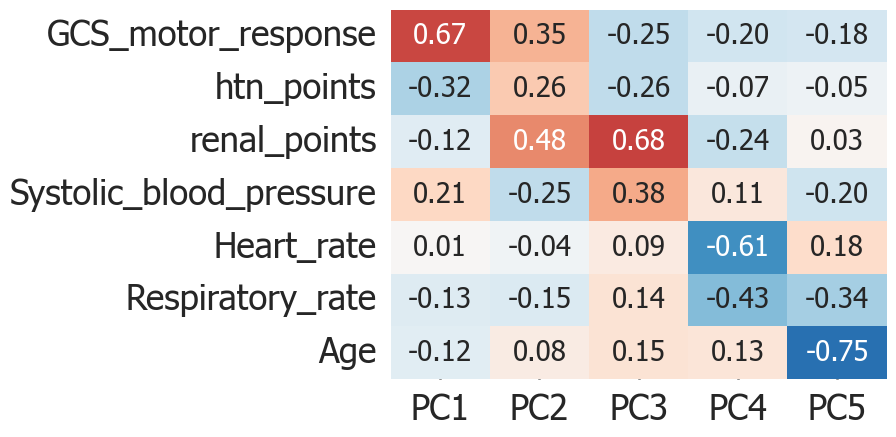

In [28]:
sns.heatmap(
    loadings.loc[top_features_combined, pc_list[:max(4, num_pc)]], 
    annot=True, cmap='RdBu_r', annot_kws={'size': 20}, fmt='.2f',
    center=0, cbar_kws={'label': 'Loading'}, vmax=1, vmin=-1, cbar=False
)
plt.ylabel('')

In [29]:
f1 = dps.feature_set == 'sofs+vtls+dmos1'
f2 = dps.boot=='all'
f3 = dps.n_pc == '5'
sls = []
for n_cmp in np.arange(2,15):
    cc = dps[f1&f3].sort_values('rd', ascending=False).iloc[:n_cmp*101,3:8]
    cc = cc.drop_duplicates()
    kms = [KMeans(n_clusters=nn, random_state=0, n_init=5).fit(cc.values) for nn in np.arange(2,min(15, len(cc)))]
    sls.append([silhouette_score(cc, km.labels_) for km in kms])

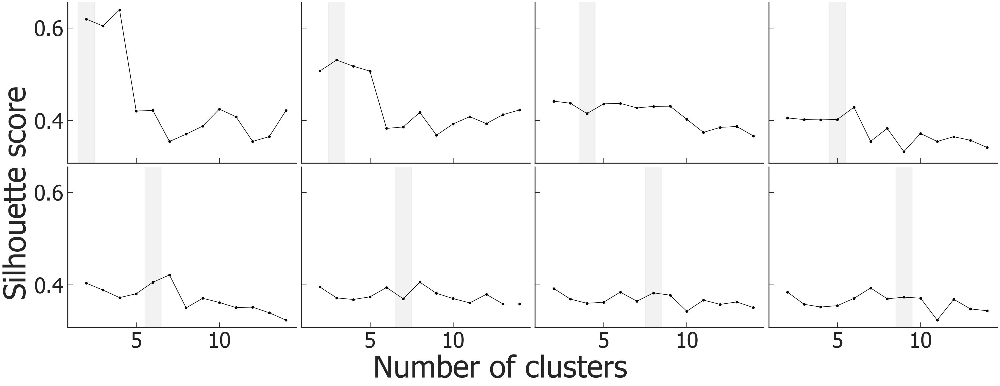

In [30]:
nc = 4
nr = 2
fig, axs = plt.subplots(nr, nc, figsize=plots.stdfigsize(nx=nc, ny=nr), constrained_layout=True, sharex=True, sharey=True)

for i in range(nr*nc):
    axs[i//nc, i%nc].plot(np.arange(2,len(sls[i])+2), sls[i], marker='o', color='k')
    axs[i//nc, i%nc].axvspan(i+1.5,i+2.5, color='gray', alpha=0.1)
    axs[i//nc, i%nc].tick_params(axis='both', which='major', labelsize=56)

fig.supxlabel('Number of clusters', ha='center', fontsize=80)
fig.supylabel('Silhouette score', va='center', fontsize=80)
plt.show()

In [31]:
n_cmp = 3
cc = dps[f1&f3].sort_values('rd', ascending=False).iloc[:n_cmp*101,3:8]
cc = cc.drop_duplicates()
kms = KMeans(n_clusters=n_cmp, random_state=0, n_init=5).fit(cc.values)

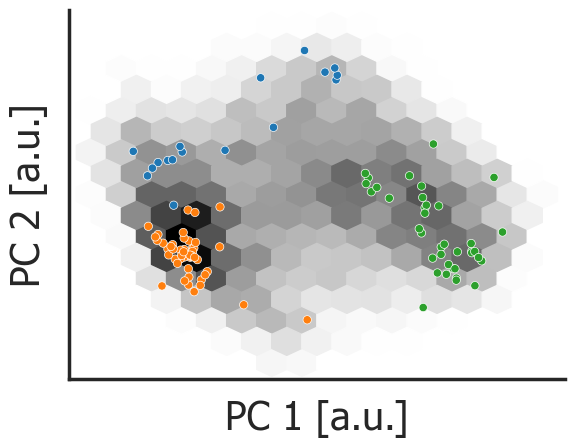

In [32]:
f1 = dps.feature_set == 'sofs+vtls+dmos1'
f2 = dps.boot=='all'
f3 = dps.n_pc == '5'
plt.hexbin(dps[f1 & f2 & f3].loc[:,'PC1'], dps[f1 & f2 & f3].loc[:,'PC2'], cmap='gray_r', zorder=1, gridsize=15)
sns.scatterplot(data=cc, x='PC1', y='PC2', hue=kms.labels_, zorder=2, legend=False, palette='tab10')
plt.xticks([])
plt.yticks([])
plt.xlabel('PC 1 [a.u.]')
plt.ylabel('PC 2 [a.u.]')
plt.show()

### sofs+vtls+dmos

In [33]:
feature_set = 'sofs+vtls+dmos'
num_pc = 5

data, _ = load_and_prepare_dataset(dataset='carpediem', feature_set=feature_set, \
                                imputation_strategy='CarryLastForward_limit2', scaler_name='KBD', holdout=.1)
pca = PCA(n_components=num_pc)
pcaX = pca.fit_transform(data.iloc[:,:-1])

loadings = pca.components_
pc_list = ["PC"+str(i) for i in list(range(1, num_pc+1))]
pcaX = pd.DataFrame(pcaX, columns=pc_list, index=data.index)
loadings = pd.DataFrame.from_dict(dict(zip(pc_list, loadings)))
loadings['variable'] = data.iloc[:,:-1].columns.values
loadings = loadings.set_index('variable')

top_features = {}
for pc in pc_list:
    sorted_loadings = loadings[pc].abs().sort_values(ascending=False)
    top_features[pc] = sorted_loadings.head(5).index.tolist()

In [34]:
top_features

{'PC1': ['GCS_motor_response',
  'GCS_eye_opening',
  'htn_points',
  'Diastolic_blood_pressure',
  'GCS_verbal_response'],
 'PC2': ['renal_points',
  'Mean_arterial_pressure',
  'GCS_motor_response',
  'Diastolic_blood_pressure',
  'Temperature'],
 'PC3': ['renal_points',
  'Systolic_blood_pressure',
  'htn_points',
  'GCS_motor_response',
  'Diastolic_blood_pressure'],
 'PC4': ['Heart_rate',
  'Respiratory_rate',
  'Oxygen_saturation',
  'Temperature',
  'renal_points'],
 'PC5': ['Age',
  'Respiratory_rate',
  'platelet_points',
  'BMI',
  'Systolic_blood_pressure']}

In [35]:
top_features_combined = [
    'GCS_motor_response', 
    'htn_points',
    'renal_points',
    'Systolic_blood_pressure',
    'Heart_rate',
    'Respiratory_rate', 
    'Age'
]

Text(11.27777777777776, 0.5, '')

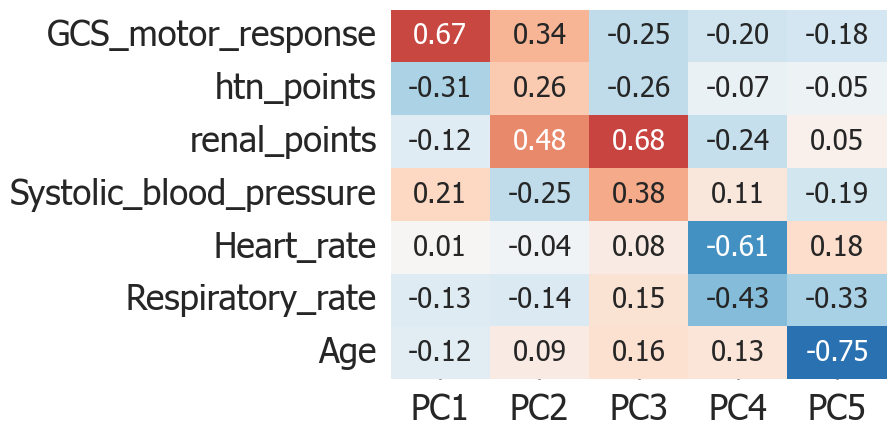

In [36]:
sns.heatmap(
    loadings.loc[top_features_combined, pc_list[:max(4, num_pc)]], 
    annot=True, cmap='RdBu_r', annot_kws={'size': 20}, fmt='.2f',
    center=0, cbar_kws={'label': 'Loading'}, 
    vmax=1, vmin=-1, cbar=False
)
plt.ylabel('')

In [37]:
nominal_features = ['Ethnicity', 'Gender', 'Race', 'Smoking_status']

In [38]:
nominal_features = [i for i in loadings.index if any(nominal_feature in i for nominal_feature in nominal_features)]
# top_features_combined.extend(nominal_features)

Text(11.27777777777774, 0.5, 'Nominal \n demographics')

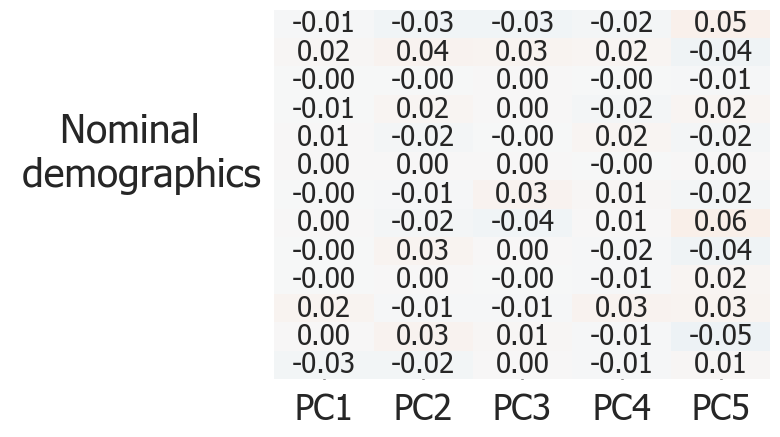

In [39]:
sns.heatmap(
    loadings.loc[nominal_features, pc_list[:max(4, num_pc)]], 
    annot=True, cmap='RdBu_r', annot_kws={'size': 20}, fmt='.2f',
    center=0, cbar_kws={'label': 'Loading'}, vmin=-1, vmax=1, cbar=False
)
plt.yticks([])
plt.ylabel('Nominal \n demographics', rotation=0, labelpad=100)

### sofs+vtls+dmos1+flgs

In [40]:
feature_set = 'sofs+vtls+dmos1+flgs'
num_pc = 5

data, _ = load_and_prepare_dataset(dataset='carpediem', feature_set=feature_set, \
                                imputation_strategy='CarryLastForward_limit2', scaler_name='KBD', holdout=.1)
pca = PCA(n_components=num_pc)
pcaX = pca.fit_transform(data.iloc[:,:-1])

loadings = pca.components_
pc_list = ["PC"+str(i) for i in list(range(1, num_pc+1))]
pcaX = pd.DataFrame(pcaX, columns=pc_list, index=data.index)
loadings = pd.DataFrame.from_dict(dict(zip(pc_list, loadings)))
loadings['variable'] = data.iloc[:,:-1].columns.values
loadings = loadings.set_index('variable')

top_features = {}
for pc in pc_list:
    sorted_loadings = loadings[pc].abs().sort_values(ascending=False)
    top_features[pc] = sorted_loadings.head(5).index.tolist()

In [41]:
top_features

{'PC1': ['GCS_motor_response',
  'GCS_eye_opening',
  'htn_points',
  'Diastolic_blood_pressure',
  'GCS_verbal_response'],
 'PC2': ['renal_points',
  'GCS_motor_response',
  'Mean_arterial_pressure',
  'Diastolic_blood_pressure',
  'Temperature'],
 'PC3': ['renal_points',
  'Systolic_blood_pressure',
  'htn_points',
  'Diastolic_blood_pressure',
  'Mean_arterial_pressure'],
 'PC4': ['Heart_rate',
  'Respiratory_rate',
  'Oxygen_saturation',
  'Temperature',
  'GCS_motor_response'],
 'PC5': ['Age',
  'Respiratory_rate',
  'platelet_points',
  'Heart_rate',
  'Temperature']}

In [42]:
top_features_combined = [
    'GCS_motor_response', 
    'htn_points',
    'renal_points',
    'Systolic_blood_pressure',
    'Heart_rate',
    'Respiratory_rate', 
    'Age'
]

Text(11.27777777777776, 0.5, '')

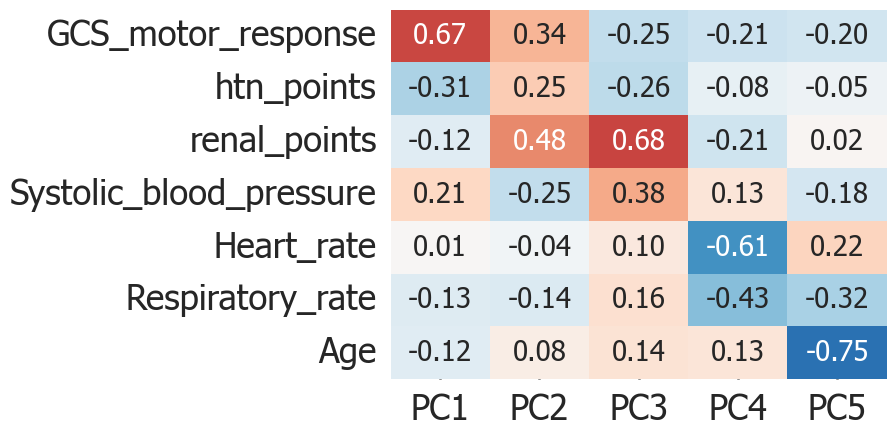

In [43]:
sns.heatmap(
    loadings.loc[top_features_combined, pc_list[:max(4, num_pc)]], 
    annot=True, cmap='RdBu_r', annot_kws={'size': 20}, fmt='.2f',
    center=0, cbar_kws={'label': 'Loading'}, vmin=-1, vmax=1, cbar=False
)
plt.ylabel('')

In [44]:
flg_features = ['ECMO_flag', 'Intubation_flag', 'Hemodialysis_flag', 'CRRT_flag', 'Tracheostomy_flag']

Text(11.277777777777768, 0.5, '')

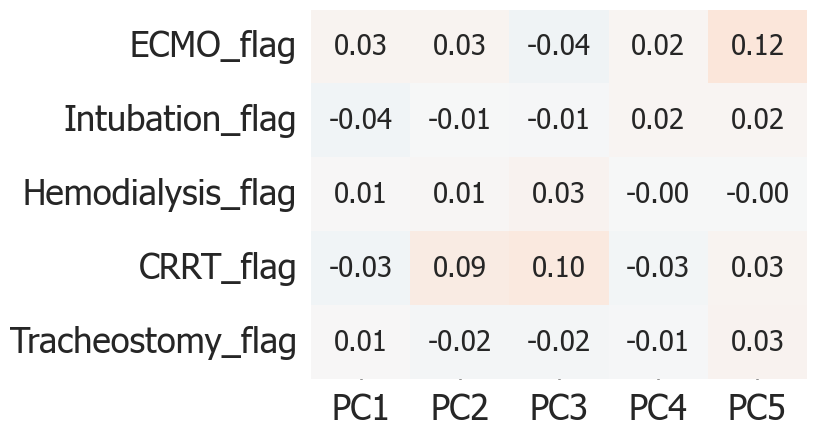

In [45]:
sns.heatmap(
    loadings.loc[flg_features, pc_list[:max(4, num_pc)]], 
    annot=True, cmap='RdBu_r', annot_kws={'size': 20}, fmt='.2f',
    center=0, cbar_kws={'label': 'Loading'}, vmin=-1, vmax=1, cbar=False
)
plt.ylabel('')

### sofs+vtls+dmos1+lbs1

In [46]:
feature_set = 'sofs+vtls+dmos1+lbs1'
num_pc = 6
data, _ = load_and_prepare_dataset(dataset='carpediem', feature_set=feature_set, \
                                imputation_strategy='CarryLastForward_limit2', scaler_name='KBD', holdout=.1)

pca = PCA(n_components=num_pc)
pcaX = pca.fit_transform(data.iloc[:,:-1])

loadings = pca.components_
pc_list = ["PC"+str(i) for i in list(range(1, num_pc+1))]
pcaX = pd.DataFrame(pcaX, columns=pc_list, index=data.index)
loadings = pd.DataFrame.from_dict(dict(zip(pc_list, loadings)))
loadings['variable'] = data.iloc[:,:-1].columns.values
loadings = loadings.set_index('variable')

top_features = {}
for pc in pc_list:
    sorted_loadings = loadings[pc].abs().sort_values(ascending=False)
    top_features[pc] = sorted_loadings.head(5).index.tolist()

In [47]:
top_features

{'PC1': ['GCS_motor_response',
  'GCS_eye_opening',
  'htn_points',
  'Diastolic_blood_pressure',
  'Mean_arterial_pressure'],
 'PC2': ['renal_points',
  'Platelets',
  'GCS_motor_response',
  'Bicarbonate',
  'Creatinine'],
 'PC3': ['Creatinine',
  'renal_points',
  'Bicarbonate',
  'Systolic_blood_pressure',
  'Diastolic_blood_pressure'],
 'PC4': ['Platelets',
  'platelet_points',
  'Age',
  'WBC_count',
  'Mean_arterial_pressure'],
 'PC5': ['Heart_rate',
  'Respiratory_rate',
  'WBC_count',
  'Oxygen_saturation',
  'Temperature'],
 'PC6': ['WBC_count',
  'Oxygen_saturation',
  'Hemoglobin',
  'Temperature',
  'GCS_motor_response']}

In [48]:
top_features_combined = [
    'GCS_motor_response', 
    'renal_points',
    'Creatinine',
    'Platelets',
    'Heart_rate',
    'Respiratory_rate', 
    'WBC_count', 
]

Text(11.27777777777776, 0.5, '')

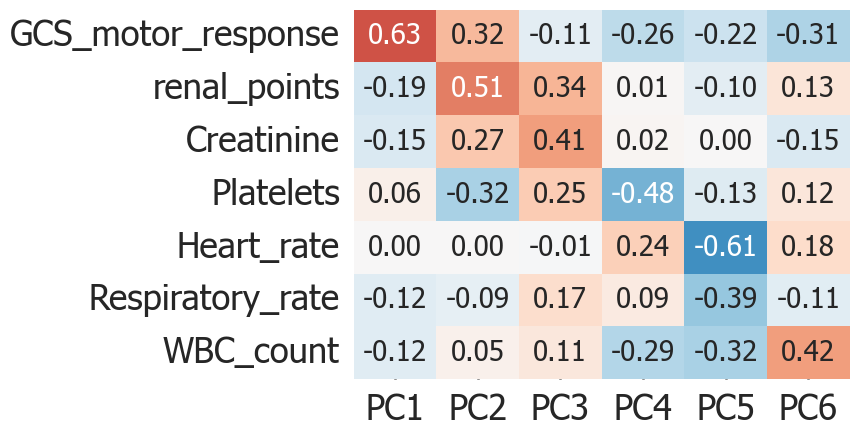

In [49]:
sns.heatmap(
    loadings.loc[top_features_combined, pc_list[:max(4, num_pc)]], 
    annot=True, cmap='RdBu_r', annot_kws={'size': 20}, fmt='.2f',
    center=0, cbar_kws={'label': 'Loading'}, vmin=-1, vmax=1, cbar=False
)
plt.ylabel('')

In [50]:
f1 = dps.feature_set == 'sofs+vtls+dmos1+lbs1'
f2 = dps.boot=='all'
f3 = dps.n_pc == '6'
sls = []
for n_cmp in np.arange(2,15):
    cc = dps[f1&f3].sort_values('rd', ascending=False).iloc[:n_cmp*101,3:9]
    cc = cc.drop_duplicates()
    kms = [KMeans(n_clusters=nn, random_state=0, n_init=5).fit(cc.values) for nn in np.arange(2,min(15, len(cc)))]
    sls.append([silhouette_score(cc, km.labels_) for km in kms])

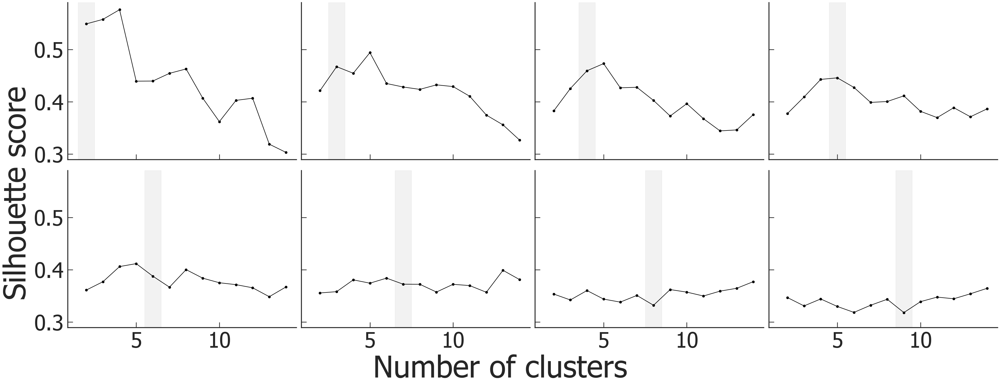

In [51]:
nc = 4
nr = 2
fig, axs = plt.subplots(nr, nc, figsize=plots.stdfigsize(nx=nc, ny=nr), constrained_layout=True, sharex=True, sharey=True)

for i in range(nr*nc):
    axs[i//nc, i%nc].plot(np.arange(2,len(sls[i])+2), sls[i], marker='o', color='k')
    axs[i//nc, i%nc].axvspan(i+1.5,i+2.5, color='gray', alpha=0.1)
    axs[i//nc, i%nc].tick_params(axis='both', which='major', labelsize=56)

fig.supxlabel('Number of clusters', ha='center', fontsize=80)
fig.supylabel('Silhouette score', va='center', fontsize=80)
plt.show()

In [52]:
n_cmp = 5
cc = dps[f1&f3].sort_values('rd', ascending=False).iloc[:n_cmp*101,3:9]
kms = KMeans(n_clusters=n_cmp, random_state=0, n_init=5).fit(cc.values)

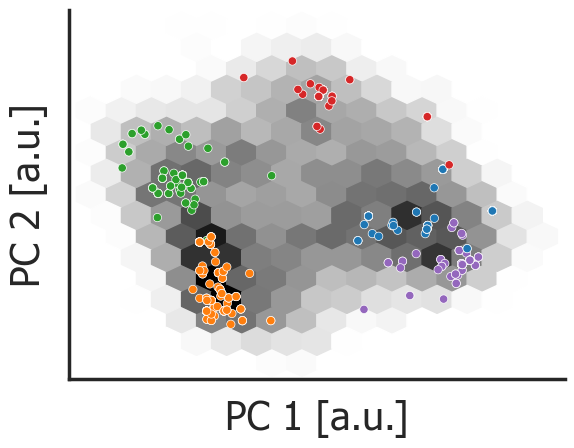

In [53]:
plt.hexbin(dps[f1 & f2 &f3].loc[:,'PC1'], dps[f1 & f2&f3].loc[:,'PC2'], cmap='gray_r', zorder=1, gridsize=15)
sns.scatterplot(data=cc, x='PC1', y='PC2', hue=kms.labels_, zorder=2, legend=False, palette='tab10')
plt.xticks([])
plt.yticks([])
plt.xlabel('PC 1 [a.u.]')
plt.ylabel('PC 2 [a.u.]')
plt.show()

## comparision

In [54]:
def edpc(dps, feature_set, n_cmp, n_pc, se=99):
    f1 = dps.feature_set==feature_set
    f2 = dps.boot=='all'
    f3 = dps.n_pc == str(n_pc)
    cc = dps[f1&f3].sort_values('rd', ascending=False).iloc[:n_cmp*101][[f'PC{i}' for i in range(1,n_pc+1)]]
    cc = cc.drop_duplicates()
    km = KMeans(n_clusters=n_cmp, random_state=0, n_init=5).fit(cc.values)
    gm = GaussianMixture(n_components=n_cmp, means_init=km.cluster_centers_, fix_means=True, random_state=se).fit(dps.loc[f1&f2&f3, [f'PC{i}' for i in range(1,n_pc+1)]])
    gm_pred = gm.predict(dps.loc[f1&f2&f3, [f'PC{i}' for i in range(1,n_pc+1)]])
    gm_scr = gm.score_samples(dps.loc[f1&f2&f3, [f'PC{i}' for i in range(1,n_pc+1)]])
    dps.loc[f1&f2&f3, f'{feature_set}_pred'] = gm_pred
    dps.loc[f1&f2&f3, f'{feature_set}_scr'] = gm_scr
    return dps, gm

In [55]:
out, gm_script_sofs = edpc(dps, 'sofs', 4, 2)
out, gm_script_sofs_vtls = edpc(out, 'sofs+vtls', 5, 4)
out, gm_script_sofs_vtls_dmos1 = edpc(out, 'sofs+vtls+dmos1', 3, 5)
out, gm_script_sofs_vtls_dmos1_lbs1 = edpc(out, 'sofs+vtls+dmos1+lbs1', 5, 6)

In [56]:
out = out[out.boot=='all'][list(out.columns[:3]) + list(out.columns[22:])]

In [57]:
out = out[['Patient_id', 'ICU_stay', 'ICU_day', 'sofs_pred', 'sofs_scr']].dropna().merge(
    out[['Patient_id', 'ICU_stay', 'ICU_day', 'sofs+vtls_pred', 'sofs+vtls_scr']].dropna(), how='outer').merge(
    out[['Patient_id', 'ICU_stay', 'ICU_day', 'sofs+vtls+dmos1_pred', 'sofs+vtls+dmos1_scr']].dropna(), how='outer').merge(
    out[['Patient_id', 'ICU_stay', 'ICU_day', 'sofs+vtls+dmos1+lbs1_pred', 'sofs+vtls+dmos1+lbs1_scr']].dropna(), how='outer')#.merge(
    # out[['Patient_id', 'ICU_stay', 'ICU_day', 'sofs+vtls+dmos1+lbs1+vents_pred', 'sofs+vtls+dmos1+lbs1+vents_scr']].dropna(), how='outer').merge(
    # out[['Patient_id', 'ICU_stay', 'ICU_day', 'sofs+vtls+dmos1+lbs2_pred', 'sofs+vtls+dmos1+lbs2_scr']].dropna(), how='outer')

In [58]:
carpediem, carpediem2 = load_carpediem()
carpediem = carpediem_icu(carpediem, carpediem2)

carpediem = carpediem_edps(carpediem)

In [59]:
out = out.merge(carpediem, how='outer', on=['Patient_id', 'ICU_stay', 'ICU_day'])

In [60]:
out = out.sort_values(['Patient_id', 'ICU_stay', 'ICU_day'])

In [61]:
pred_cols = [i for i in out.columns if 'pred' in i]
for i in pred_cols:
    tmp = (out[out['edps'] == 'dying'].groupby(i).size() / out.groupby(i).size()).reset_index(name='mortality_24h').fillna(0).sort_values('mortality_24h')
    mapping = {cluster: f'C{j+1}' for j, cluster in enumerate(tmp[i])} 
    print(mapping, '\n', i)
    out[i] = out[i].map(mapping)
    # out[i] = pd.Categorical(out[i], categories=mapping.values(), ordered=True)

{2.0: 'C1', 1.0: 'C2', 3.0: 'C3', 0.0: 'C4'} 
 sofs_pred
{0.0: 'C1', 2.0: 'C2', 4.0: 'C3', 3.0: 'C4', 1.0: 'C5'} 
 sofs+vtls_pred
{2.0: 'C1', 1.0: 'C2', 0.0: 'C3'} 
 sofs+vtls+dmos1_pred
{2.0: 'C1', 4.0: 'C2', 0.0: 'C3', 3.0: 'C4', 1.0: 'C5'} 
 sofs+vtls+dmos1+lbs1_pred


In [62]:
out_script = out.copy()

### mortality

In [63]:
out_script['days_to_discharge'] = np.where(
    out_script['ICU_stay'] == out_script['max_icu'],
    out_script['ICU_len'] - out_script['ICU_day'] + out_script['days_from_last_ICU_day_to_discharge'],
    np.nan
)

In [64]:
out_script['discharge'] = out_script['Discharge_disposition'].map({
    'Died': 'Died',
    'Home': 'Home',
    'Rehab': 'Other',
    'Hospice': 'Other',
    'LTACH': 'Other',
    'SNF': 'Other'
})

In [65]:
out_script['days_to_discharge_binned'] = np.where(
    out_script['days_to_discharge'] < 2, '< 2 days',
    np.where(
        out_script['days_to_discharge'] < 8, '2-8 days',
        np.where(
            out_script['days_to_discharge'] < 32, '8-32 days',
            np.where(
                out_script['days_to_discharge'] < 64, '32-64 days',
                '>= 64 days'
            )
        )
    )
)

In [66]:
mors = []
tmp = out_script.copy()
for ff in ['sofs', 'sofs+vtls', 'sofs+vtls+dmos1', 'sofs+vtls+dmos1+lbs1']:
    for dd in [1,2,4,8,16,'all']:
        f1 = tmp.Discharge_disposition=='Died'
        f2 = tmp.days_to_discharge<dd if dd!='all' else tmp.days_to_discharge.notna()
        mor = tmp[f1&f2].groupby(f'{ff}_pred', observed=False).size() / tmp.groupby(f'{ff}_pred', observed=False).size()
        mors.append(pd.DataFrame({
            'mortality': mor.fillna(0).values,
            'cluster': mor.index,
            'feature': ff,
            'days': str(dd)
        }))

In [67]:
mor = pd.concat(mors, ignore_index=True)
mor['mortality'] = mor['mortality'] * 100

/var/folders/bq/h_mr2101559bvvsl7rpwj9y1fy1_l0/T/ipykernel_48872/2711236362.py:61: RuntimeWarning: divide by zero encountered in divide
  fold_change_c2_c1 = c2 / c1


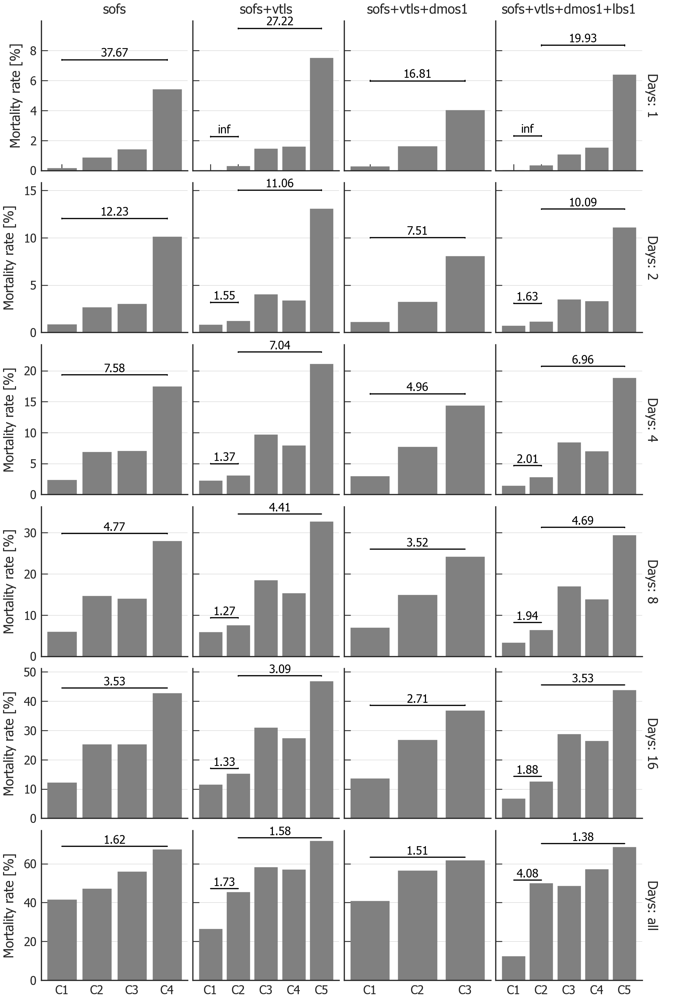

In [68]:
g = sns.catplot(
    data=mor, 
    row='days', 
    y='mortality', 
    x='cluster', 
    col='feature', 
    kind='bar', 
    errorbar=None,
    sharey='row', 
    sharex='col',
    margin_titles=True,
    color='gray',
    linewidth=2.5, edgecolor=".5"
)

for (row_val, col_val), ax in g.axes_dict.items():
    ax.set_title('')
    ax.grid(axis='y')
    
    # Extract the data corresponding to this specific panel
    data = mor[
        (mor['days'] == row_val) &
        (mor['feature'] == col_val)
    ]
    
    if col_val == 'sofs':
        c1 = data.loc[data['cluster'] == 'C1', 'mortality'].values
        c4 = data.loc[data['cluster'] == 'C4', 'mortality'].values
        
        if len(c1) > 0 and len(c4) > 0:
            fold_change_c4_c1 = c4 / c1
            y_max_c1_c4 = max(max(c1), max(c4))
            line_y = y_max_c1_c4 + 2
            ax.plot([0, 3], [line_y, line_y], color='black', linewidth=2.5)
            ax.plot([0, 0], [line_y - 0.03, line_y + 0.03], color='black', linewidth=2.5)  # Left vertical cap
            ax.plot([3, 3], [line_y - 0.03, line_y + 0.03], color='black', linewidth=2.5)  # Right vertical cap
            ax.annotate(f'{fold_change_c4_c1[0]:.2f}', xy=(1.5, line_y + 0.04), xycoords='data',
                        ha='center', va='bottom', fontsize=24, color='black')
    
    elif col_val == 'sofs+vtls+dmos1':
        c1 = data.loc[data['cluster'] == 'C1', 'mortality'].values
        c3 = data.loc[data['cluster'] == 'C3', 'mortality'].values
        
        if len(c1) > 0 and len(c3) > 0:
            fold_change_c3_c1 = c3 / c1
            y_max_c1_c3 = max(max(c1), max(c3))
            line_y = y_max_c1_c3 + 2
            ax.plot([0, 2], [line_y, line_y], color='black', linewidth=2.5)
            ax.plot([0, 0], [line_y - 0.03, line_y + 0.03], color='black', linewidth=2.5)  # Left vertical cap
            ax.plot([2, 2], [line_y - 0.03, line_y + 0.03], color='black', linewidth=2.5)  # Right vertical cap
            ax.annotate(f'{fold_change_c3_c1[0]:.2f}', xy=(1, line_y + 0.04), xycoords='data',
                        ha='center', va='bottom', fontsize=24, color='black')
            
    else:
        c1 = data.loc[data['cluster'] == 'C1', 'mortality'].values
        c2 = data.loc[data['cluster'] == 'C2', 'mortality'].values
        c5 = data.loc[data['cluster'] == 'C5', 'mortality'].values
        
        # Draw line and annotate fold change C2/C1 with vertical caps
        if len(c1) > 0 and len(c2) > 0:
            fold_change_c2_c1 = c2 / c1
            y_max_c1_c2 = max(max(c1), max(c2))
            line_y = y_max_c1_c2 + 2
            ax.plot([0, 1], [line_y, line_y], color='black', linewidth=2.5)
            ax.plot([0, 0], [line_y - 0.03, line_y + 0.03], color='black', linewidth=2.5)  # Left vertical cap
            ax.plot([1, 1], [line_y - 0.03, line_y + 0.03], color='black', linewidth=2.5)  # Right vertical cap
            ax.annotate(f'{fold_change_c2_c1[0]:.2f}', xy=(0.5, line_y + 0.04), xycoords='data',
                        ha='center', va='bottom', fontsize=24, color='black')

        # Draw line and annotate fold change C5/C2 with vertical caps
        if len(c2) > 0 and len(c5) > 0:
            fold_change_c5_c2 = c5 / c2
            y_max_c2_c5 = max(max(c2), max(c5))
            line_y = y_max_c2_c5 + 2
            ax.plot([1, 4], [line_y, line_y], color='black', linewidth=2.5)
            ax.plot([1, 1], [line_y - 0.03, line_y + 0.03], color='black', linewidth=2.5)  # Left vertical cap
            ax.plot([4, 4], [line_y - 0.03, line_y + 0.03], color='black', linewidth=2.5)  # Right vertical cap
            ax.annotate(f'{fold_change_c5_c2[0]:.2f}', xy=(2.5, line_y + 0.04), xycoords='data',
                        ha='center', va='bottom', fontsize=24, color='black')
        
g.set_titles(row_template='Days: {row_name}', col_template='{col_name}')
g.set_axis_labels('', 'Mortality rate [%]')


plt.show()

### recover rate

In [69]:
rcvs = []

for ff in ['sofs', 'sofs+vtls', 'sofs+vtls+dmos1', 'sofs+vtls+dmos1+lbs1']:
    rcv = pd.DataFrame(columns=[f'{ff}_pred'])
    for dd in [4,8,16]:
        tmp = out_script.copy()
        rcv = rcv.merge((tmp[(tmp['discharge'] == 'Home')&(tmp['days_to_discharge']<=(dd-1))].groupby(f'{ff}_pred').size() / tmp.groupby(f'{ff}_pred').size()).reset_index(name=f'{dd}').fillna(0).sort_values(f'{dd}'), how='outer', on=f'{ff}_pred')
    tmp = out_script.copy()
    rcv = rcv.merge((tmp[(tmp['discharge'] == 'Home')&(tmp['days_to_discharge'].notna())].groupby(f'{ff}_pred').size() / tmp.groupby(f'{ff}_pred').size()).reset_index(name=f'all').fillna(0).sort_values(f'all'), how='outer', on=f'{ff}_pred')
    
    rcv['feature_set'] = ff
    rcv.rename(columns={f'{ff}_pred': 'cluster'}, inplace=True)
    rcvs.append(rcv)


In [70]:
rcv = pd.concat(rcvs)
rcv = rcv.melt(id_vars=['feature_set', 'cluster'], var_name='Nday', value_name='rcv')
rcv['rcv'] = rcv['rcv'] * 100

In [71]:
rcvs_cnt = []

for ff in ['sofs', 'sofs+vtls', 'sofs+vtls+dmos1', 'sofs+vtls+dmos1+lbs1']:
    rcv_cnt = pd.DataFrame(columns=[f'{ff}_pred'])
    for dd in [4,8,16]:
        tmp = out_script.copy()
        rcv_cnt = rcv_cnt.merge((tmp[(tmp['discharge'] == 'Home')&(tmp['days_to_discharge']<=(dd-1))].groupby(f'{ff}_pred').size()).reset_index(name=f'rcv_{dd}d').fillna(0).sort_values(f'rcv_{dd}d'), how='outer', on=f'{ff}_pred')
    tmp = out_script.copy()
    rcv_cnt = rcv_cnt.merge((tmp[(tmp['discharge'] == 'Home')&(tmp['days_to_discharge'].notna())].groupby(f'{ff}_pred').size()).reset_index(name=f'rcv_all').fillna(0).sort_values(f'rcv_all'), how='outer', on=f'{ff}_pred')
    
    rcv_cnt['feature_set'] = ff
    rcv_cnt.rename(columns={f'{ff}_pred': 'cluster'}, inplace=True)
    rcvs_cnt.append(rcv_cnt)


In [72]:
rcv_cnt = pd.concat(rcvs_cnt)
rcv_cnt = rcv_cnt.melt(id_vars=['feature_set', 'cluster'], var_name='Nday', value_name='rcv')
# rcv_cnt['rcv'] = rcv_cnt['rcv'] * 100

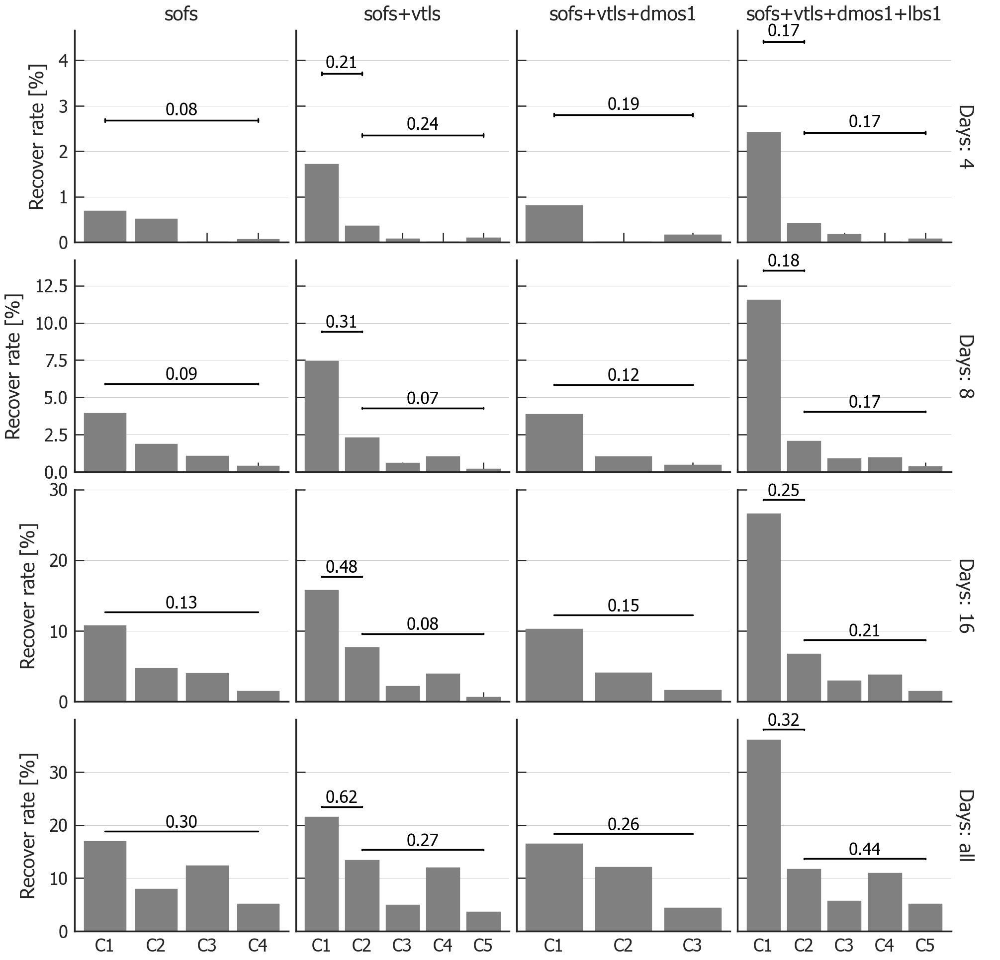

In [73]:
g = sns.catplot(
    data=rcv.sort_values('cluster'), 
    row='Nday', 
    y='rcv', 
    row_order=['4', '8', '16', 'all'],
    x='cluster', 
    col='feature_set', 
    col_order=['sofs', 'sofs+vtls', 'sofs+vtls+dmos1', 'sofs+vtls+dmos1+lbs1'],
    kind='bar', 
    errorbar=None,
    sharey='row', 
    sharex='col',
    margin_titles=True,
    color='gray',
    linewidth=2.5, edgecolor=".5"
)

for (row_val, col_val), ax in g.axes_dict.items():
    ax.set_title('')
    ax.grid(axis='y')

    data = rcv[
        (rcv['Nday'] == row_val) &
        (rcv['feature_set'] == col_val)
    ]
    
    if col_val == 'sofs':
        c1 = data.loc[data['cluster'] == 'C1', 'rcv'].values
        c4 = data.loc[data['cluster'] == 'C4', 'rcv'].values
        
        if len(c1) > 0 and len(c4) > 0:
            fold_change_c4_c1 = c4 / c1
            y_max_c1_c4 = max(max(c1), max(c4))
            line_y = y_max_c1_c4 + 2
            ax.plot([0, 3], [line_y, line_y], color='black', linewidth=2.5)
            ax.plot([0, 0], [line_y - 0.03, line_y + 0.03], color='black', linewidth=2.5)  # Left vertical cap
            ax.plot([3, 3], [line_y - 0.03, line_y + 0.03], color='black', linewidth=2.5)  # Right vertical cap
            ax.annotate(f'{fold_change_c4_c1[0]:.2f}', xy=(1.5, line_y + 0.04), xycoords='data',
                        ha='center', va='bottom', fontsize=24, color='black')
    
    elif col_val == 'sofs+vtls+dmos1':
        c1 = data.loc[data['cluster'] == 'C1', 'rcv'].values
        c3 = data.loc[data['cluster'] == 'C3', 'rcv'].values
        
        if len(c1) > 0 and len(c3) > 0:
            fold_change_c3_c1 = c3 / c1
            y_max_c1_c3 = max(max(c1), max(c3))
            line_y = y_max_c1_c3 + 2
            ax.plot([0, 2], [line_y, line_y], color='black', linewidth=2.5)
            ax.plot([0, 0], [line_y - 0.03, line_y + 0.03], color='black', linewidth=2.5)  # Left vertical cap
            ax.plot([2, 2], [line_y - 0.03, line_y + 0.03], color='black', linewidth=2.5)  # Right vertical cap
            ax.annotate(f'{fold_change_c3_c1[0]:.2f}', xy=(1, line_y + 0.04), xycoords='data',
                        ha='center', va='bottom', fontsize=24, color='black')
            
    else:
        c1 = data.loc[data['cluster'] == 'C1', 'rcv'].values
        c2 = data.loc[data['cluster'] == 'C2', 'rcv'].values
        c5 = data.loc[data['cluster'] == 'C5', 'rcv'].values
        
        # Draw line and annotate fold change C2/C1 with vertical caps
        if len(c1) > 0 and len(c2) > 0:
            fold_change_c2_c1 = c2 / c1
            y_max_c1_c2 = max(max(c1), max(c2))
            line_y = y_max_c1_c2 + 2
            ax.plot([0, 1], [line_y, line_y], color='black', linewidth=2.5)
            ax.plot([0, 0], [line_y - 0.03, line_y + 0.03], color='black', linewidth=2.5)  # Left vertical cap
            ax.plot([1, 1], [line_y - 0.03, line_y + 0.03], color='black', linewidth=2.5)  # Right vertical cap
            ax.annotate(f'{fold_change_c2_c1[0]:.2f}', xy=(0.5, line_y + 0.04), xycoords='data',
                        ha='center', va='bottom', fontsize=24, color='black')

        # Draw line and annotate fold change C5/C2 with vertical caps
        if len(c2) > 0 and len(c5) > 0:
            fold_change_c5_c2 = c5 / c2
            y_max_c2_c5 = max(max(c2), max(c5))
            line_y = y_max_c2_c5 + 2
            ax.plot([1, 4], [line_y, line_y], color='black', linewidth=2.5)
            ax.plot([1, 1], [line_y - 0.03, line_y + 0.03], color='black', linewidth=2.5)  # Left vertical cap
            ax.plot([4, 4], [line_y - 0.03, line_y + 0.03], color='black', linewidth=2.5)  # Right vertical cap
            ax.annotate(f'{fold_change_c5_c2[0]:.2f}', xy=(2.5, line_y + 0.04), xycoords='data',
                        ha='center', va='bottom', fontsize=24, color='black')

g.set_titles(row_template='Days: {row_name}', col_template='{col_name}')
g.set_axis_labels('', 'Recover rate [%]')



plt.show()

### ari similarity

In [74]:
pred_columns = [i for i in out.columns if 'pred' in i]
aris = np.zeros((len(pred_columns), len(pred_columns)))
for i, pred1 in enumerate(pred_columns):
    for j, pred2 in enumerate(pred_columns):
        out1 = out.dropna(subset=[pred1, pred2])
        aris[i,j] = adjusted_rand_score(out1[pred1], out1[pred2])

[Text(0.5, 0, 'sofs'),
 Text(1.5, 0, 'sofs+vtls'),
 Text(2.5, 0, 'sofs+vtls+dmos1'),
 Text(3.5, 0, 'sofs+vtls+dmos1+lbs1')]

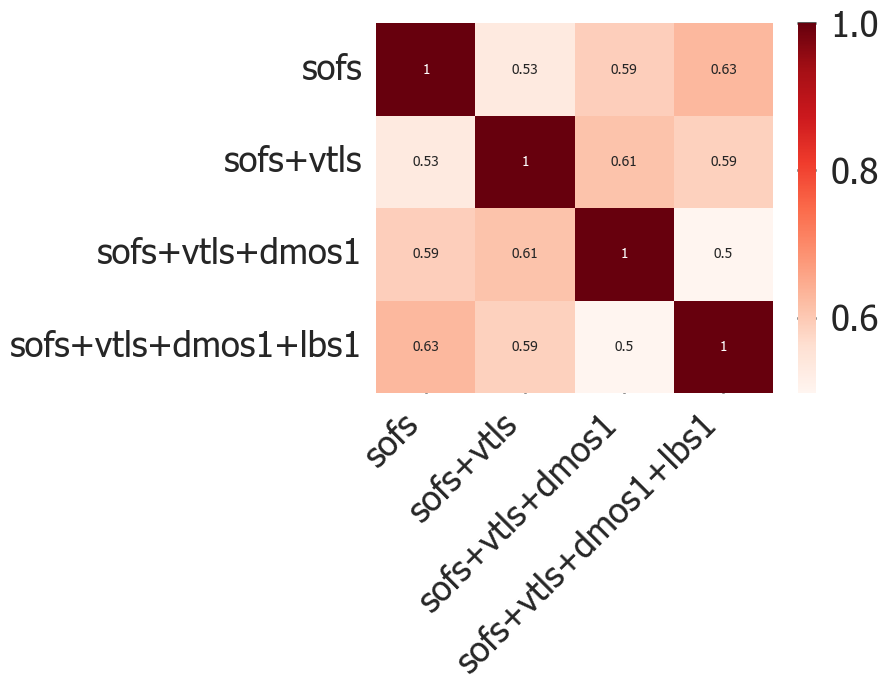

In [75]:
g = sns.heatmap(aris, xticklabels=[i.split('_')[0] for i in pred_columns], yticklabels=[i.split('_')[0] for i in pred_columns], annot=True, cmap='Reds')
g.set_xticklabels(g.get_xticklabels(), rotation=45, ha='right')

### contingency

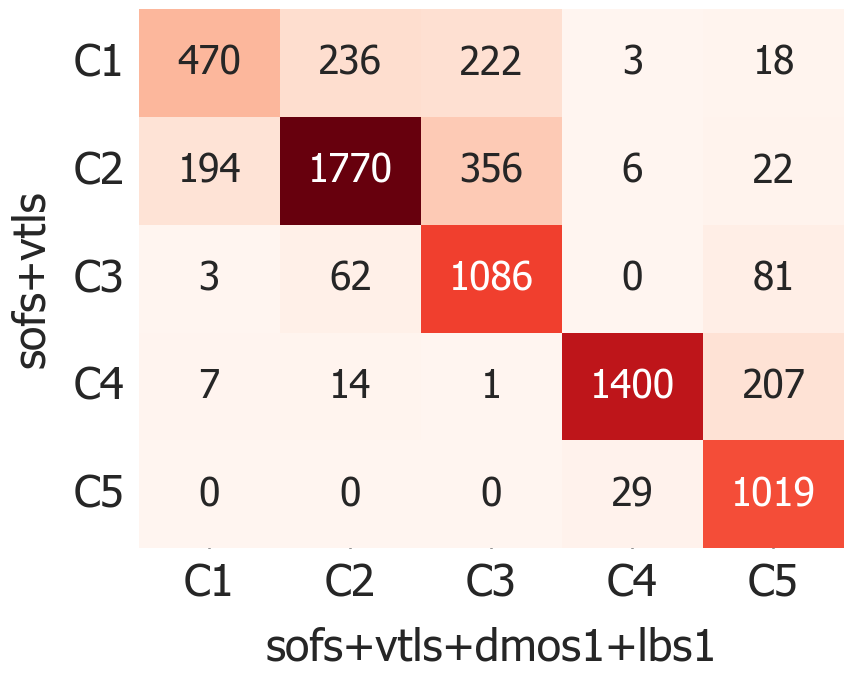

In [76]:
col2='sofs+vtls+dmos1+lbs1_pred'
col1='sofs+vtls_pred'
heatmap_data = out.groupby([col1, col2]).size().unstack().fillna(0)
plt.figure(figsize=plots.stdfigsize(1,1))
sns.heatmap(heatmap_data, cmap='Reds', annot=True, fmt='.0f', cbar=False, annot_kws={'size': 28})
plt.xlabel(f'{col2.strip("_pred")}', fontsize=32)
plt.ylabel(f'{col1.strip("_pred")}', fontsize=32)
plt.xticks(fontsize=32)
plt.yticks(fontsize=32, rotation=0)
plt.title('')
plt.show()

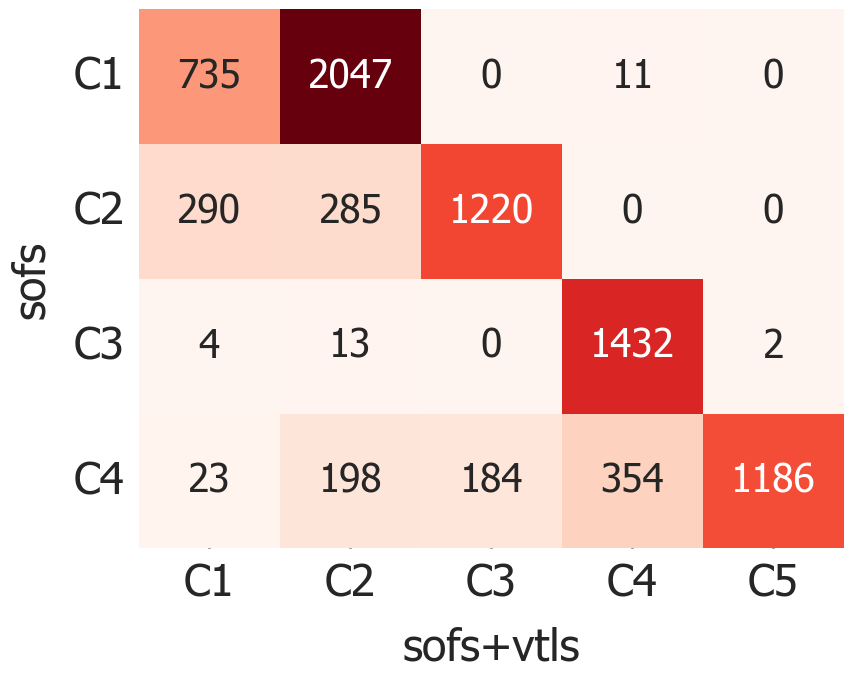

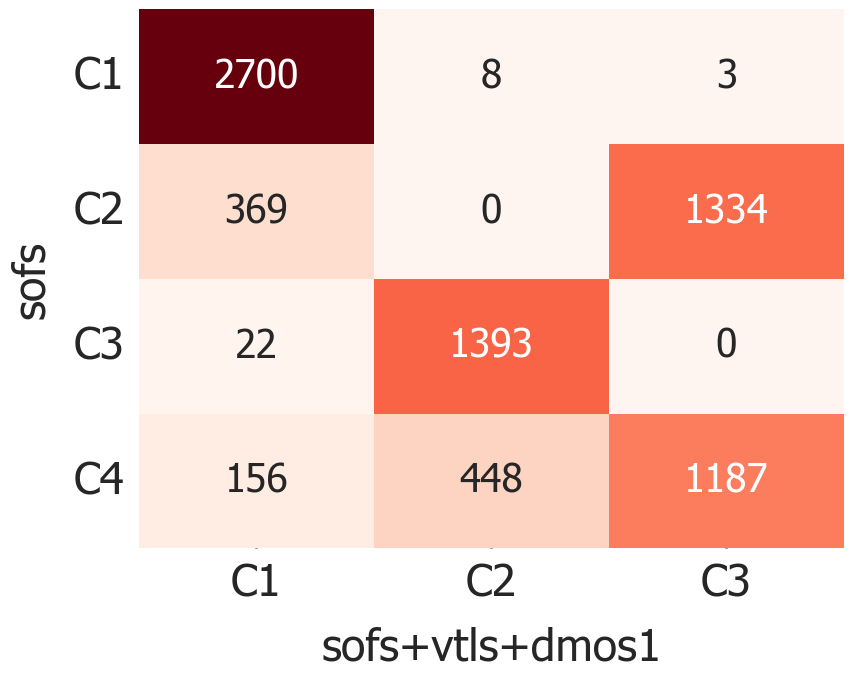

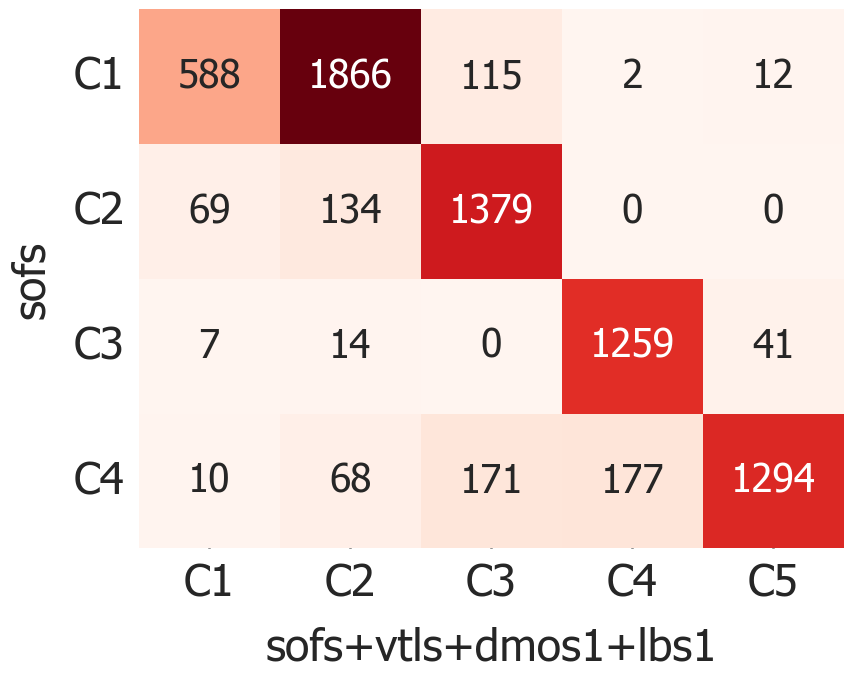

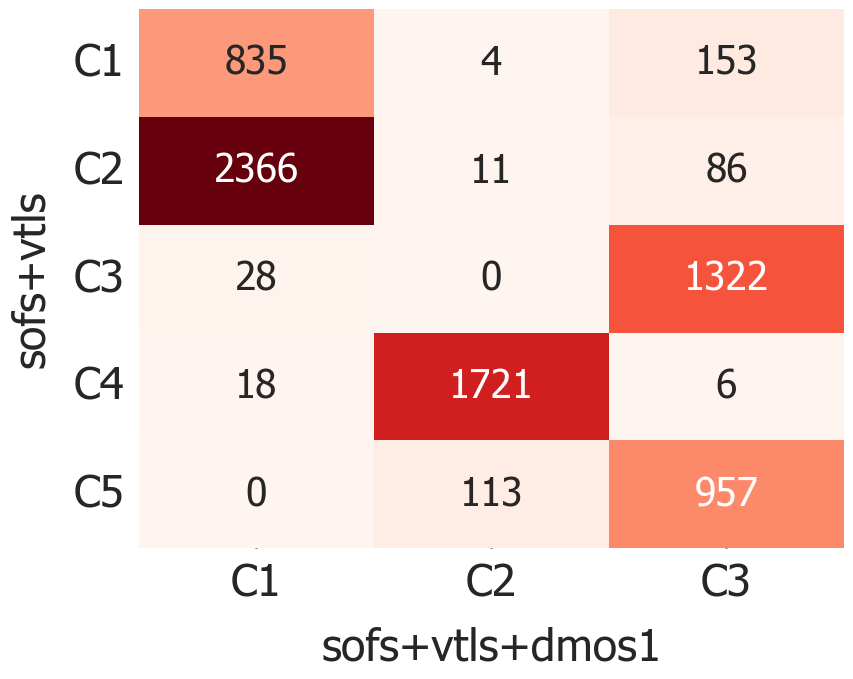

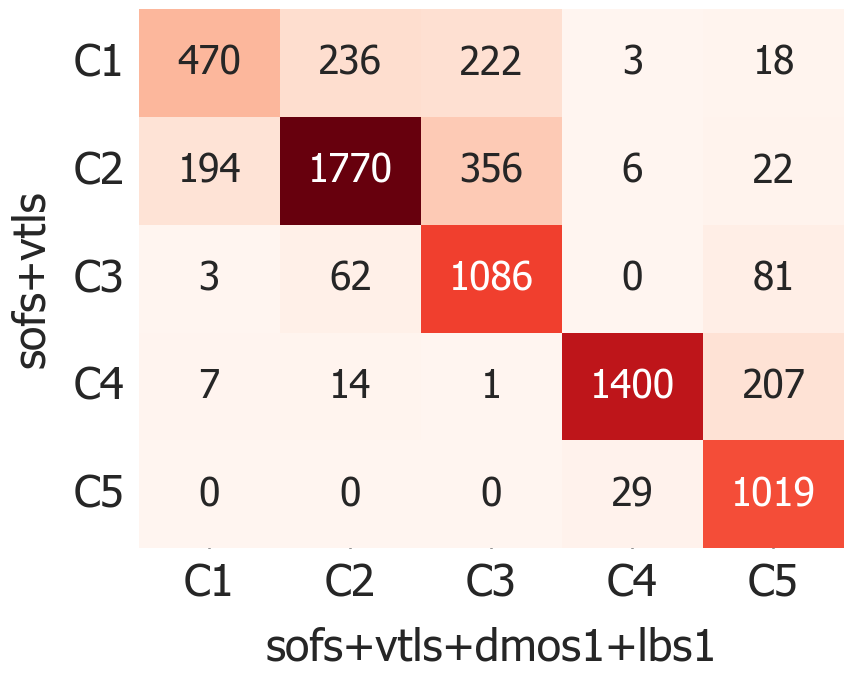

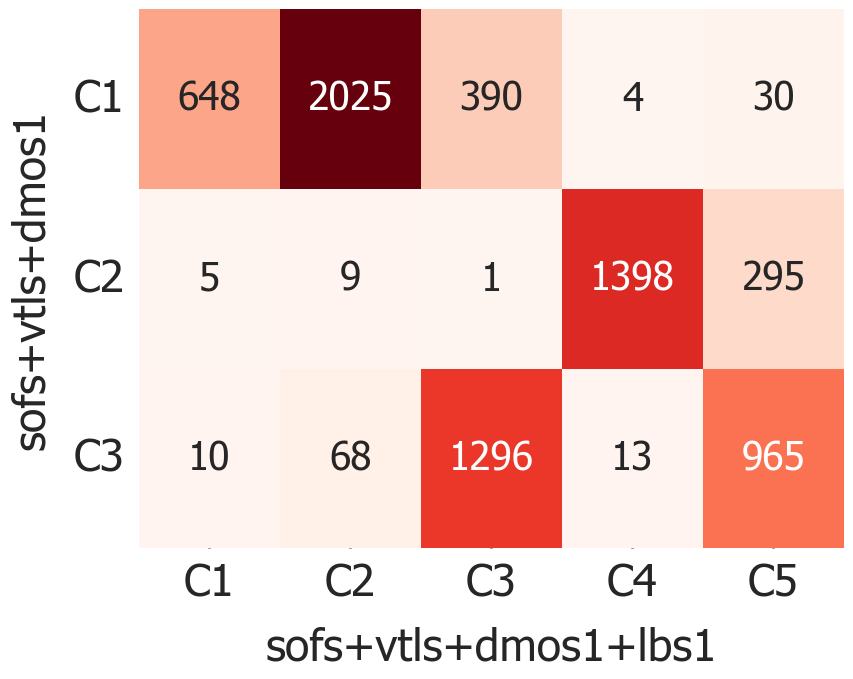

In [77]:
pred_columns = [i for i in out.columns if 'pred' in i]

for col1, col2 in itertools.combinations(pred_columns, 2):
    heatmap_data = out.groupby([col1, col2]).size().unstack().fillna(0)

    ## Normalize strategy 1
    # row_sums = heatmap_data.sum(axis=1)
    # heatmap_data = heatmap_data.div(row_sums, axis=0)
    # col_sums = heatmap_data.sum(axis=0)
    # heatmap_data = heatmap_data.div(col_sums, axis=1)

    ## Normalize strategy 2
    # row_means = heatmap_data.mean(axis=1)
    # row_stds = heatmap_data.std(axis=1)
    # heatmap_data = heatmap_data.sub(row_means, axis=0).div(row_stds, axis=0)
    # col_means = heatmap_data.mean(axis=0)
    # col_stds = heatmap_data.std(axis=0)
    # heatmap_data = heatmap_data.sub(col_means, axis=1).div(col_stds, axis=1)

    plt.figure(figsize=plots.stdfigsize(1,1))
    sns.heatmap(heatmap_data, cmap='Reds', annot=True, fmt='.0f', cbar=False, annot_kws={'size': 28})
    plt.xlabel(f'{col2.strip("_pred")}', fontsize=32)
    plt.ylabel(f'{col1.strip("_pred")}', fontsize=32)
    plt.xticks(fontsize=32)
    plt.yticks(fontsize=32, rotation=0)
    plt.title('')
    plt.show()
    # break

In [78]:
def create_sankey_plot(df, col1, col2):
    tmp = df.groupby([col1, col2]).size().to_frame('value').reset_index()
    
    mapping_col1 = {value: idx for idx, value in enumerate(sorted(set(tmp[col1].unique())))}
    mapping_col2 = {value: idx+tmp[col1].nunique() for idx, value in enumerate(sorted(set(tmp[col2].unique())))}
    
    tmp = tmp.assign(
        source=tmp[col1].map(mapping_col1),
        target=tmp[col2].map(mapping_col2)
    )
    
    label = list(mapping_col1.keys()) + list(mapping_col2.keys())
    
    fig = go.Figure(data=[go.Sankey(
        node=dict(
            pad=15,
            thickness=20,
            line=dict(color="black", width=0.5),
            label=label,
        ),
        link=dict(
            source=tmp['source'],
            target=tmp['target'],
            value=tmp['value']
        )
    )])

    # Add annotations for columns
    for x_coordinate, column_name in enumerate([col1, col2]):
        fig.add_annotation(
            x=x_coordinate,
            y=1.1,
            # xref="x",
            # yref="paper",
            text=f"{column_name.strip('_pred')}",
            showarrow=False,
            font=dict(
                # family="Courier New, monospace",
                size=28,
            ),
            align="center",
        )

    fig.update_layout(
        title_text='',
        font_size=28,
        autosize=False,
        width=plots.stdfigsize(nx=1, ny=1)[0]*100,
        height=plots.stdfigsize(nx=1, ny=1)[1]*100
    )
    fig.show()


In [79]:
pred_cols = [
    'sofs_pred',
    'sofs+vtls_pred',
    'sofs+vtls+dmos1_pred',
    'sofs+vtls+dmos1+lbs1_pred',
    # 'sofs+vtls+dmos1+lbs1+vents_pred', 
    # 'sofs+vtls+dmos1+lbs2_pred'
]

# Generate Sankey plots for each combination of columns
for col1, col2 in itertools.combinations(pred_cols, 2):
    create_sankey_plot(out, col1, col2)

### sample log likelihood

In [80]:
def r2(x, y, ax=None, **kws):
    ax = ax or plt.gca()
    slope, intercept, r_value, p_value, std_err = linregress(x=x, y=y)
    ax.annotate(f'$r^2 = {r_value ** 2:.2f}$\nEq: ${slope:.2f}x{intercept:+.2f}$',
                xy=(.05, .95), xycoords=ax.transAxes, fontsize=28,
                color='k', ha='left', va='top')


sofs sofs+vtls {'C1': 'C1', 'C2': 'C1', 'C3': 'C2', 'C4': 'C3', 'C5': 'C4'} 6620 7984


/var/folders/bq/h_mr2101559bvvsl7rpwj9y1fy1_l0/T/ipykernel_48872/1123577894.py:28: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



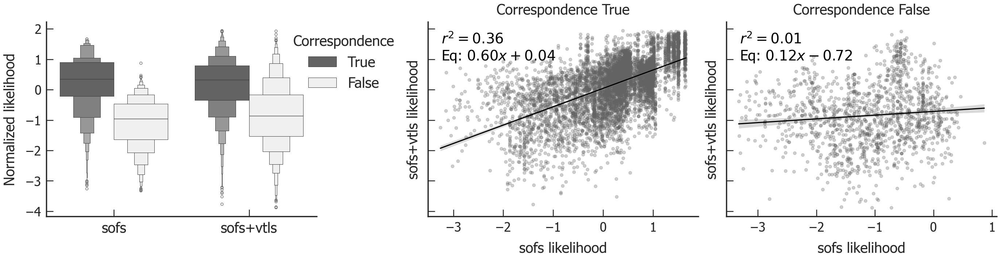

sofs sofs+vtls+dmos1 {'C1': 'C1', 'C2': 'C3', 'C3': 'C2', 'C4': 'C3'} 6614 7620


/var/folders/bq/h_mr2101559bvvsl7rpwj9y1fy1_l0/T/ipykernel_48872/1123577894.py:28: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



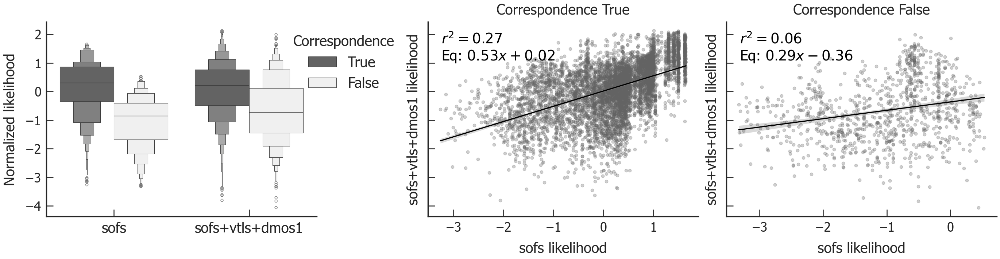

sofs sofs+vtls+dmos1+lbs1 {'C1': 'C1', 'C2': 'C1', 'C3': 'C2', 'C4': 'C3', 'C5': 'C4'} 6386 7206


/var/folders/bq/h_mr2101559bvvsl7rpwj9y1fy1_l0/T/ipykernel_48872/1123577894.py:28: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



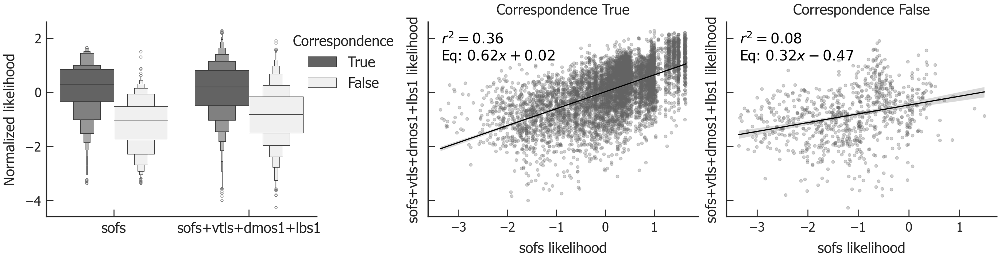

sofs+vtls sofs+vtls+dmos1 {'C1': 'C1', 'C2': 'C1', 'C3': 'C3', 'C4': 'C2', 'C5': 'C3'} 7201 7620


/var/folders/bq/h_mr2101559bvvsl7rpwj9y1fy1_l0/T/ipykernel_48872/1123577894.py:28: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



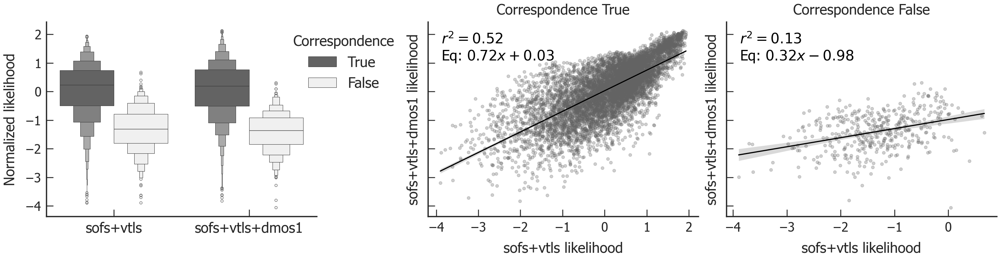

sofs+vtls sofs+vtls+dmos1+lbs1 {'C1': 'C1', 'C2': 'C2', 'C3': 'C3', 'C4': 'C4', 'C5': 'C5'} 5745 7206


/var/folders/bq/h_mr2101559bvvsl7rpwj9y1fy1_l0/T/ipykernel_48872/1123577894.py:28: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



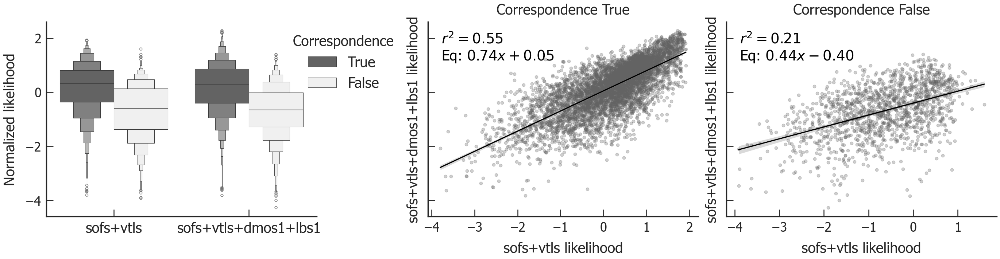

sofs+vtls+dmos1 sofs+vtls+dmos1+lbs1 {'C1': 'C1', 'C2': 'C1', 'C3': 'C3', 'C4': 'C2', 'C5': 'C3'} 6332 7157


/var/folders/bq/h_mr2101559bvvsl7rpwj9y1fy1_l0/T/ipykernel_48872/1123577894.py:28: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



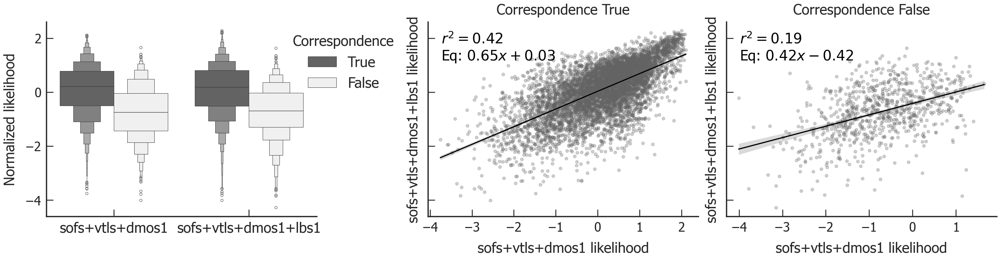

In [81]:
feature_sets = ['sofs', 'sofs+vtls', 'sofs+vtls+dmos1', 'sofs+vtls+dmos1+lbs1']

for fea1, fea2 in itertools.combinations(feature_sets, 2):
    tmp = out.dropna(subset=[f'{fea1}_pred', f'{fea2}_pred'])
    cont_mat = contingency_matrix(tmp[f'{fea1}_pred'], tmp[f'{fea2}_pred'])
    if np.argmax(cont_mat.shape) == 0:
        mapping = {i: j for i, j in zip(sorted(set(tmp[f'{fea1}_pred'])), np.array(sorted(set(tmp[f'{fea2}_pred'])))[np.argmax(cont_mat, axis=1)])}
        tmp = tmp.assign(cntngncy = tmp[f'{fea1}_pred'].map(mapping)==tmp[f'{fea2}_pred'])
    elif np.argmax(cont_mat.shape) == 1:
        mapping = {i: j for i, j in zip(sorted(set(tmp[f'{fea2}_pred'])), np.array(sorted(set(tmp[f'{fea1}_pred'])))[np.argmax(cont_mat, axis=0)])}
        tmp = tmp.assign(cntngncy = tmp[f'{fea1}_pred']==tmp[f'{fea2}_pred'].map(mapping))
    print(fea1, fea2, mapping, sum(tmp['cntngncy']), len(tmp))

    # normalize likelihood
    tmp[[i for i in tmp.columns if 'scr' in i]] = tmp[[i for i in tmp.columns if 'scr' in i]].apply(lambda x: (x-x.mean())/x.std(), axis=0)
    # tmp[[i for i in tmp.columns if 'scr' in i]] = tmp[[i for i in tmp.columns if 'scr' in i]].apply(lambda x: x.rank(pct=True), axis=0)
    
    fig, axs = plt.subplots(1, 3, figsize=plots.stdfigsize(nx=3, ny=1), constrained_layout=True, sharex=False, sharey=True)

    sns.boxenplot(
        data=tmp.melt(id_vars=['cntngncy'], value_vars=[f'{fea1}_scr', f'{fea2}_scr']), 
        y='value', x='variable', hue='cntngncy', hue_order=[True, False], 
        ax=axs[0], palette={True: '#636363', False: '#f0f0f0'}
    )
    sns.move_legend(axs[0], loc='upper center', title='Correspondence', frameon=False, fontsize=28, title_fontsize=28, bbox_to_anchor=(1.1,1))
    axs[0].set_ylabel('Normalized likelihood')
    axs[0].set_xlabel('')
    axs[0].set_xticklabels([f'{fea1}', f'{fea2}'], fontsize=28)
    sns.regplot(data=tmp[tmp['cntngncy']], x=f'{fea1}_scr', y=f'{fea2}_scr', scatter_kws={'alpha':0.3}, ax=axs[1], color='#636363', line_kws={'color': 'k'})
    r2(tmp[tmp['cntngncy']][f'{fea1}_scr'], tmp[tmp['cntngncy']][f'{fea2}_scr'], ax=axs[1], color='#636363')
    axs[1].set_xlabel(f'{fea1} likelihood')
    axs[1].set_ylabel(f'{fea2} likelihood')
    axs[1].set_title('Correspondence True')

    sns.regplot(data=tmp[~tmp['cntngncy']], x=f'{fea1}_scr', y=f'{fea2}_scr', scatter_kws={'alpha':0.3}, ax=axs[2], color='#636363', line_kws={'color': 'k'})
    r2(tmp[~tmp['cntngncy']][f'{fea1}_scr'], tmp[~tmp['cntngncy']][f'{fea2}_scr'], ax=axs[2])
    axs[2].set_xlabel(f'{fea1} likelihood')
    axs[2].set_ylabel(f'{fea2} likelihood')
    axs[2].set_title('Correspondence False')
    plt.show()
    # break


In [82]:
f1 = out['sofs_scr'] >= out['sofs_scr'].quantile(.25)
f2 = out['sofs+vtls_scr'] >= out['sofs+vtls_scr'].quantile(.25)
f3 = out['sofs+vtls+dmos1_scr'] >= out['sofs+vtls+dmos1_scr'].quantile(.25)
f4 = out['sofs+vtls+dmos1+lbs1_scr'] >= out['sofs+vtls+dmos1+lbs1_scr'].quantile(.25)

In [83]:
pred_columns = [i for i in out.columns if 'pred' in i]
aris1 = np.zeros((len(pred_columns), len(pred_columns)))
aris2 = np.zeros((len(pred_columns), len(pred_columns)))
for i, pred1 in enumerate(pred_columns):
    for j, pred2 in enumerate(pred_columns):
        out1 = out.dropna(subset=[pred1, pred2])
        out2 = out[[f1,f2,f3,f4][i]&[f1,f2,f3,f4][j]].dropna(subset=[pred1, pred2])
        aris1[i,j] = adjusted_rand_score(out1[pred1], out1[pred2])
        aris2[i,j] = adjusted_rand_score(out2[pred1], out2[pred2])

Text(0.5, 1.0, 'Likelihood $\\geq$ 25th percentile')

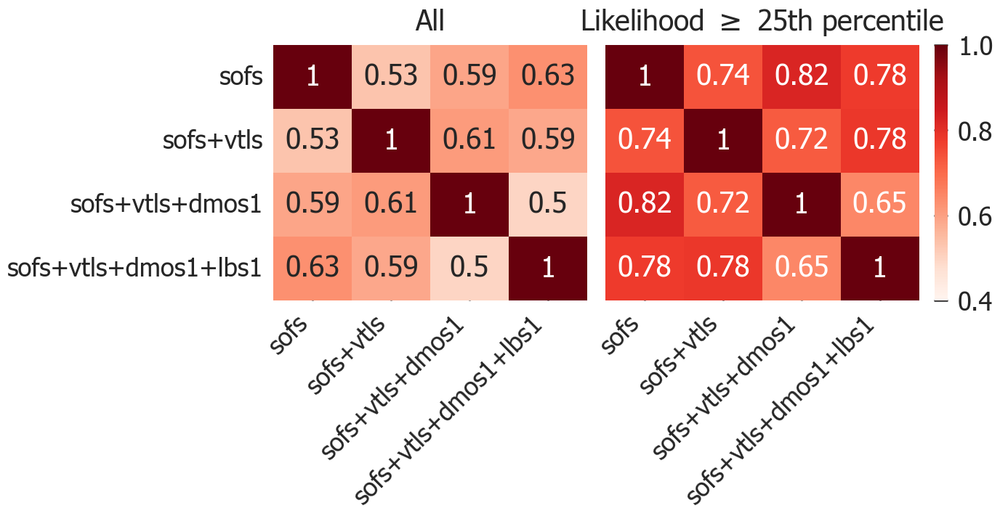

In [84]:
fig, axs = plt.subplots(1, 2, figsize=plots.stdfigsize(nx=1.5, ny=1), constrained_layout=True, sharex=True, sharey=True)
g = sns.heatmap(
    aris1, xticklabels=[i.split('_')[0] for i in pred_columns], yticklabels=[i.split('_')[0] for i in pred_columns], 
    annot=True, cbar=False, cmap='Reds', ax=axs[0], vmin=0.4, vmax=1, 
    annot_kws={'size': 28}
)
g.set_xticklabels(g.get_xticklabels(), rotation=45, ha='right') 
g.set_title('All')

g = sns.heatmap(
    aris2, xticklabels=[i.split('_')[0] for i in pred_columns], yticklabels=[i.split('_')[0] for i in pred_columns], 
    annot=True, cmap='Reds', ax=axs[1], vmin=0.4, vmax=1, 
    annot_kws={'size': 28}
)
g.set_xticklabels(g.get_xticklabels(), rotation=45, ha='right')
g.set_title('Likelihood $\geq$ 25th percentile')

In [85]:
# Create dimensions
tmp = out[(f1&f2&f3&f4)].dropna(subset=pred_columns)
sofs_dim = go.parcats.Dimension(
    values=tmp['sofs_pred'], label="sofs",
    categoryarray=['C1', 'C2', 'C4', 'C3']
)

sofs_vtls_dim = go.parcats.Dimension(
    values=tmp['sofs+vtls_pred'], label="sofs+vtls", 
    categoryarray=['C1', 'C2', 'C3', 'C5', 'C4']
)

sofs_vtls_dmos1_dim = go.parcats.Dimension(
    values=tmp['sofs+vtls+dmos1_pred'], label="sofs+vtls+dmos1", 
    categoryarray=['C1', 'C3', 'C2']
)

sofs_vtls_dmos1_lbs1_dim = go.parcats.Dimension(
    values=tmp['sofs+vtls+dmos1+lbs1_pred'], label="sofs+vtls+dmos1+lbs1", 
    categoryarray=['C1', 'C2', 'C3', 'C5', 'C4']
)

fig = go.Figure(data = [go.Parcats(
    dimensions=[sofs_vtls_dmos1_dim, sofs_dim, sofs_vtls_dim, sofs_vtls_dmos1_lbs1_dim],
    hoveron='color', hoverinfo='count+probability',
    labelfont={'size': 22},
    tickfont={'size': 22},
    arrangement='freeform'
)])

fig.update_layout(
    title_text='',
    font_size=28,
    autosize=False,
    width=plots.stdfigsize(nx=1.5, ny=1)[0]*100,
    height=plots.stdfigsize(nx=1.5, ny=1)[1]*100
)
fig.show()

In [86]:
# Create dimensions
tmp = out[(f1&f2&f3&f4)].dropna(subset=pred_columns)
sofs_dim = go.parcats.Dimension(
    values=tmp['sofs_pred'], label="sofs",
    categoryarray=['d1', 'd2', 'd4', 'd3']
)

sofs_vtls_dim = go.parcats.Dimension(
    values=tmp['sofs+vtls_pred'], label="sofs+vtls", 
    categoryarray=['d1', 'd2', 'd3', 'd5', 'd4']
)

sofs_vtls_dmos1_dim = go.parcats.Dimension(
    values=tmp['sofs+vtls+dmos1_pred'], label="sofs+vtls+dmos1", 
    categoryarray=['d1', 'd3', 'd2']
)

sofs_vtls_dmos1_lbs1_dim = go.parcats.Dimension(
    values=tmp['sofs+vtls+dmos1+lbs1_pred'], label="sofs+vtls+dmos1+lbs1", 
    categoryarray=['d1', 'd2', 'd3', 'd5', 'd4']
)

fig = go.Figure(data = [go.Parcats(
    dimensions=[sofs_dim, sofs_vtls_dim, sofs_vtls_dmos1_dim, sofs_vtls_dmos1_lbs1_dim],
    hoveron='color', hoverinfo='count+probability',
    labelfont={'size': 22},
    tickfont={'size': 22},
    arrangement='freeform'
)])

fig.update_layout(
    title_text='',
    font_size=28,
    autosize=False,
    width=plots.stdfigsize(nx=1.5, ny=1)[0]*100,
    height=plots.stdfigsize(nx=1.5, ny=1)[1]*100
)
fig.show()

## validity

### na balance

In [87]:
complete_cases = load_and_prepare_dataset(dataset='carpediem', feature_set='sofs+vtls', \
                                imputation_strategy='Complete_cases', scaler_name='KBD')

In [88]:
complete_cases = complete_cases.reset_index().assign(imputation='Complete cases')

In [89]:
tmp = complete_cases[['Patient_id', 'ICU_stay', 'ICU_day', 'imputation']].merge(out_script[['Patient_id', 'ICU_stay', 'ICU_day', 'sofs+vtls_pred', 'sofs+vtls_scr']].dropna(), how='right')

In [90]:
tmp['imputation'] = tmp.imputation.fillna('Imputed')

(0.0, 1.0)

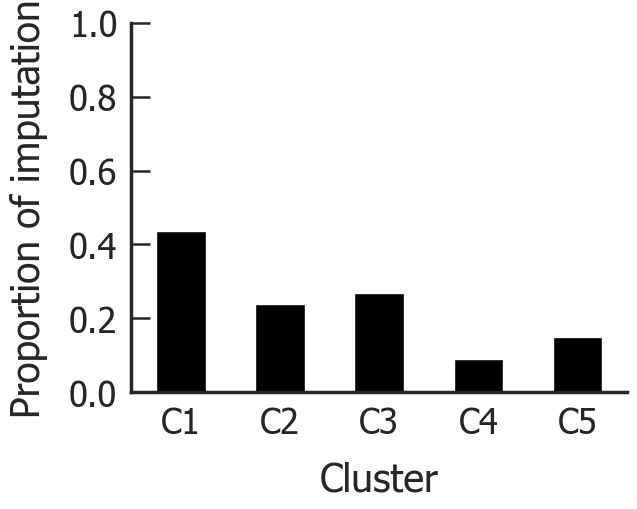

In [91]:
imputed_counts = tmp[tmp['sofs+vtls_scr']>=np.percentile(tmp['sofs+vtls_scr'],25)].groupby('sofs+vtls_pred').imputation.value_counts(normalize=True).to_frame('counts').reset_index().pivot_table(values='counts', index='sofs+vtls_pred', columns='imputation').fillna(0)
imputed_counts[['Imputed']].plot(kind='bar', color='k', legend=False)
plt.ylabel('Proportion of imputation')
plt.xlabel('Cluster')
plt.xticks(rotation=0)
plt.ylim(0,1)


### test

In [92]:
script_train, script_test = load_and_prepare_dataset(dataset='carpediem', feature_set='sofs+vtls', \
                                imputation_strategy='CarryLastForward_limit2', scaler_name='KBD', holdout=.1)

In [93]:
pcaX, pca, loadings, top_features = perform_pca(data=script_train.iloc[:,:-1], n_components=script_train.shape[1]-1, plot=False)

In [94]:
out_script_test = pd.DataFrame(pca.transform(script_test.iloc[:,:-1])[:,:4], columns=[f'PC{i}' for i in np.arange(1,5)], index=script_test.index).reset_index()

In [95]:
n_pc=4
out_script_test['sofs+vtls_pred'] = gm_script_sofs_vtls.predict(out_script_test.loc[:, [f'PC{i}' for i in np.arange(1,n_pc+1)]])
out_script_test['sofs+vtls_scr'] = gm_script_sofs_vtls.score_samples(out_script_test.loc[:, [f'PC{i}' for i in np.arange(1,n_pc+1)]])

In [96]:
out_script_test['sofs+vtls_pred'] = out_script_test['sofs+vtls_pred'].map({0.0: 'C1', 2.0: 'C2', 4.0: 'C3', 3.0: 'C4', 1.0: 'C5'})

([], [])

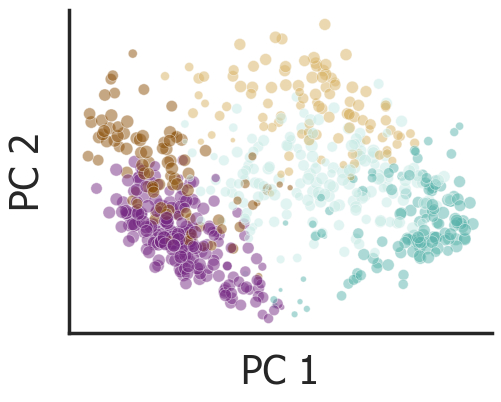

In [97]:
fig = plt.figure(figsize=plots.stdfigsize(nx=1, ny=1, scale=0.6))
sns.scatterplot(x=out_script_test['PC1'], y=out_script_test['PC2'], hue=out_script_test['sofs+vtls_pred'], 
                palette={'C1': '#5ab4ac', 'C2': '#c7eae5', 'C3': '#d8b365', 'C4': '#762a83', 'C5': '#8c510a'},
                size=out_script_test['sofs+vtls_scr'], sizes=(10, 100), alpha=0.5, legend=False, ax=fig.gca())
plt.xlabel('PC 1')
plt.ylabel('PC 2')
plt.xticks([])
plt.yticks([])

In [98]:
out_script_test = out_script_test.merge(carpediem)

In [99]:
out_script_test['days_to_discharge'] = np.where(
    out_script_test['ICU_stay'] == out_script_test['max_icu'],
    out_script_test['ICU_len'] - out_script_test['ICU_day'] + out_script_test['days_from_last_ICU_day_to_discharge'],
    np.nan
)

In [100]:
out_script_test['days_to_discharge_binned'] = np.where(
    out_script_test['days_to_discharge'] < 7, '< 7 days',
    np.where(
        out_script_test['days_to_discharge'] < 14, '7-14 days',
        np.where(
            out_script_test['days_to_discharge'] < 21, '14-21 days',
            '>= 21 days'
        )
    )
)

In [101]:
mimic_train_raw, mimic_test_raw = load_and_prepare_dataset(dataset='mimic', feature_set='sofs+vtls', \
                                imputation_strategy='Complete_cases', scaler_name='Raw', holdout=.5)

script_train_raw, script_test_raw = load_and_prepare_dataset(dataset='carpediem', feature_set='sofs+vtls', \
                                imputation_strategy='CarryLastForward_limit2', scaler_name='Raw', holdout=.1)

In [102]:
mapping_dict = {
    'respiration_24hours': 'P_F_ratio_points',
    'coagulation_24hours': 'platelet_points',
    'liver_24hours': 'bilirubin_points',
    'cardiovascular_24hours': 'htn_points',
    'gcs_motor': 'GCS_motor_response',
    'gcs_verbal': 'GCS_verbal_response',
    'gcs_eyes': 'GCS_eye_opening',
    'renal_24hours': 'renal_points',
    'heart_rate': 'Heart_rate',
    'sbp': 'Systolic_blood_pressure',
    'dbp': 'Diastolic_blood_pressure',
    'mbp': 'Mean_arterial_pressure',
    'resp_rate': 'Respiratory_rate',
    'temperature': 'Temperature',
    'spo2': 'Oxygen_saturation'
}

In [103]:
mimic_test_raw = mimic_test_raw.rename(columns=mapping_dict)[script_train_raw.columns]

In [104]:
scaler = KBinsDiscretizer(n_bins=5, encode="ordinal", strategy='quantile')
scaler.fit(script_train_raw.iloc[:, 8:-1])
# script_train_raw.iloc[:, 8:-1] = script_train_raw.transform(script_train_raw.iloc[:, 8:-1])
mimic_test_raw.iloc[:, 8:-1] = scaler.transform(mimic_test_raw.iloc[:, 8:-1])

In [105]:
Carpediem_fit_pca_transform_mimic = pca.transform(mimic_test_raw.iloc[:,:-1])
out_mimic_test = pd.DataFrame(Carpediem_fit_pca_transform_mimic, columns=[f'PC{i}' for i in np.arange(1,script_train.shape[1])], index=mimic_test_raw.index)

In [106]:
n_pc=4

In [107]:
out_mimic_test['script_pred'] = gm_script_sofs_vtls.predict(out_mimic_test.loc[:, [f'PC{i}' for i in np.arange(1,n_pc+1)]])
out_mimic_test['script_scr'] = gm_script_sofs_vtls.score_samples(out_mimic_test.loc[:, [f'PC{i}' for i in np.arange(1,n_pc+1)]])

([], [])

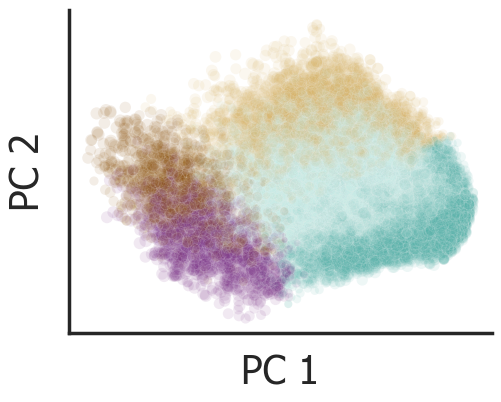

In [108]:
fig = plt.figure(figsize=plots.stdfigsize(nx=1, ny=1, scale=0.6))
sns.scatterplot(x=out_mimic_test['PC1'], y=out_mimic_test['PC2'], hue=out_mimic_test['script_pred'], 
                palette={0: '#5ab4ac', 2: '#c7eae5', 4: '#d8b365', 3: '#762a83', 1: '#8c510a'}, 
                size=out_mimic_test['script_scr'], sizes=(1, 100), alpha=0.1, legend=False, ax=fig.gca())
plt.xlabel('PC 1')
plt.ylabel('PC 2')
plt.xticks([])
plt.yticks([])

### covid

In [109]:
tmp=out_script[['COVID_status', 'sofs+vtls_pred']].dropna().groupby('sofs+vtls_pred', observed=True).COVID_status.value_counts(normalize=True)
tmp1 = out_script_test[['COVID_status', 'sofs+vtls_pred']].dropna().groupby('sofs+vtls_pred', observed=True).COVID_status.value_counts(normalize=True)

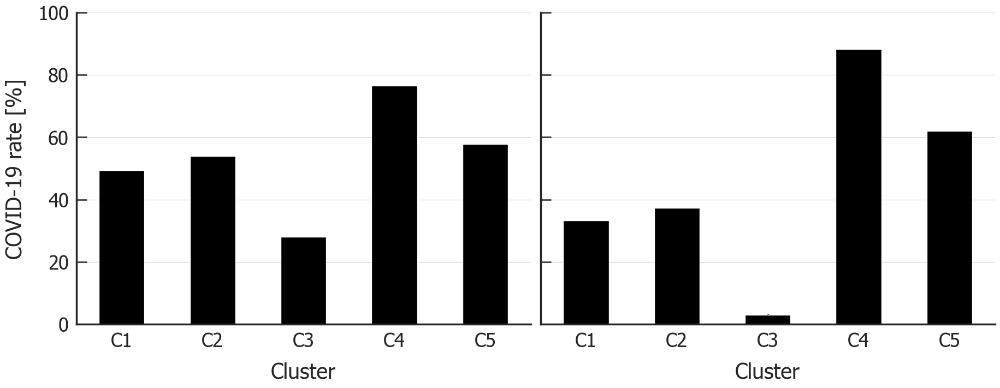

In [110]:
fig, axs = plt.subplots(1, 2, figsize=plots.stdfigsize(ny=1,nx=2), sharey=True, constrained_layout=True)
(tmp*100).xs(True, level='COVID_status').plot(kind='bar', color='k', legend=False, ax=axs[0])
(tmp1*100).xs(True, level='COVID_status').plot(kind='bar', color='k', legend=False, ax=axs[1])
axs[0].set_ylabel('COVID-19 rate [%]')
axs[0].set_xlabel('Cluster')
axs[0].set_xticklabels(axs[0].get_xticklabels(), rotation=0)
axs[0].set_ylim(0,100)
axs[0].grid(axis='y')
axs[1].set_xlabel('Cluster')
axs[1].set_xticklabels(axs[1].get_xticklabels(), rotation=0)
axs[1].set_ylim(0,100)
axs[1].grid(axis='y')

### transition

In [111]:
def impute_episodes(group):
    group = group.copy()  # Make a copy to avoid SettingWithCopyWarning
    for idx, row in group.iterrows():
        if pd.notna(row['Episode_duration']):
            # Get the number of days to forward fill
            duration = int(row['Episode_duration'])
            # Forward fill the category and etiology for the duration specified
            end_day = row['ICU_day'] + duration
            fill_idx = group[(group['ICU_day'] >= row['ICU_day']) & (group['ICU_day'] <= end_day)].index
            group.loc[fill_idx, 'Episode_category'] = row['Episode_category']
            group.loc[fill_idx, 'Episode_etiology'] = row['Episode_etiology']
            group.loc[fill_idx, 'Episode_is_cured'] = row['Episode_is_cured']
        elif pd.notna(row['Episode_category']) and pd.isna(row['Episode_duration']):
            # If the episode has no duration, fill the category and etiology until the next episode
            next_idx = group.loc[idx+1:].index
            if group.loc[next_idx, 'Episode_category'].notna().any():
                next_idx = next_idx[group.loc[next_idx, 'Episode_category'].notna()].min()
            else:
                next_idx = next_idx.max()
            group.loc[idx:next_idx, 'Episode_category'] = row['Episode_category']
            group.loc[idx:next_idx, 'Episode_etiology'] = row['Episode_etiology']
            group.loc[idx:next_idx, 'Episode_is_cured'] = row['Episode_is_cured']
    return group

In [112]:
out_script = out_script.groupby(['Patient_id', 'ICU_stay']).apply(impute_episodes, include_groups=False).reset_index().drop(columns='level_2')

In [113]:
out_script_test = out_script_test.groupby(['Patient_id', 'ICU_stay']).apply(impute_episodes, include_groups=False).reset_index().drop(columns='level_2')

In [114]:
def check_continuous(group):
    return (group['ICU_day'].diff().dropna() == 1).all()

out_script.sort_values('ICU_day').groupby(['Patient_id', 'ICU_stay']).apply(check_continuous, include_groups=False).all()

True

In [115]:
out_script['pros'] = out_script.ICU_day/out_script.ICU_len 
out_script.loc[out_script.ICU_stay!=out_script.max_icu, 'pros'] = np.nan
out_script['cpros'] = pd.cut(out_script['pros'], bins=np.linspace(0,1,6), include_lowest=True, labels=np.arange(1,6))

In [116]:
out_script_test['pros'] = out_script_test.ICU_day/out_script_test.ICU_len
out_script_test['cpros'] = pd.cut(out_script_test['pros'], bins=np.linspace(0,1,3), include_lowest=True, labels=np.arange(1,3))

In [117]:
out_script_test['discharge'] = 'Other'
out_script_test.loc[out_script_test['Discharge_disposition']=='Died', 'discharge'] = 'Died'
out_script_test.loc[out_script_test['Discharge_disposition']=='Home', 'discharge'] = 'Recovered'

In [118]:
out_script['discharge'] = 'Other'
out_script.loc[out_script['Discharge_disposition']=='Died', 'discharge'] = 'Died'
out_script.loc[out_script['Discharge_disposition']=='Home', 'discharge'] = 'Recovered'

In [119]:
np.nanpercentile(out_script['days_to_discharge'], [20,40,60,80])

array([ 6., 13., 21., 36.])

In [120]:
out_script['days_to_discharge_binned'] = np.where(
    out_script['days_to_discharge'] < 6, '< 6 days',
    np.where(
        out_script['days_to_discharge'] < 13, '6-13 days',
        np.where(
            out_script['days_to_discharge'] < 21, '13-21 days',
            np.where(
                out_script['days_to_discharge'] < 36, '21-36 days',
                '>= 36 days'
            )
        )
    )
)

In [121]:
out_script.days_to_discharge_binned = out_script.days_to_discharge_binned.astype('category').cat.reorder_categories(['>= 36 days', '21-36 days', '13-21 days', '6-13 days', '< 6 days'], ordered=True)

In [122]:
out_script_test['days_to_discharge_binned'] = np.where(
    out_script_test['days_to_discharge'] < 6, '< 6 days',
    np.where(
        out_script_test['days_to_discharge'] < 13, '6-13 days',
        np.where(
            out_script_test['days_to_discharge'] < 21, '13-21 days',
            np.where(
                out_script_test['days_to_discharge'] < 36, '21-36 days',
                '>= 36 days'
            )
        )
    )
)

In [123]:
out_script_test.days_to_discharge_binned = out_script_test.days_to_discharge_binned.astype('category').cat.reorder_categories(['>= 36 days', '21-36 days', '13-21 days', '6-13 days', '< 6 days'], ordered=True)

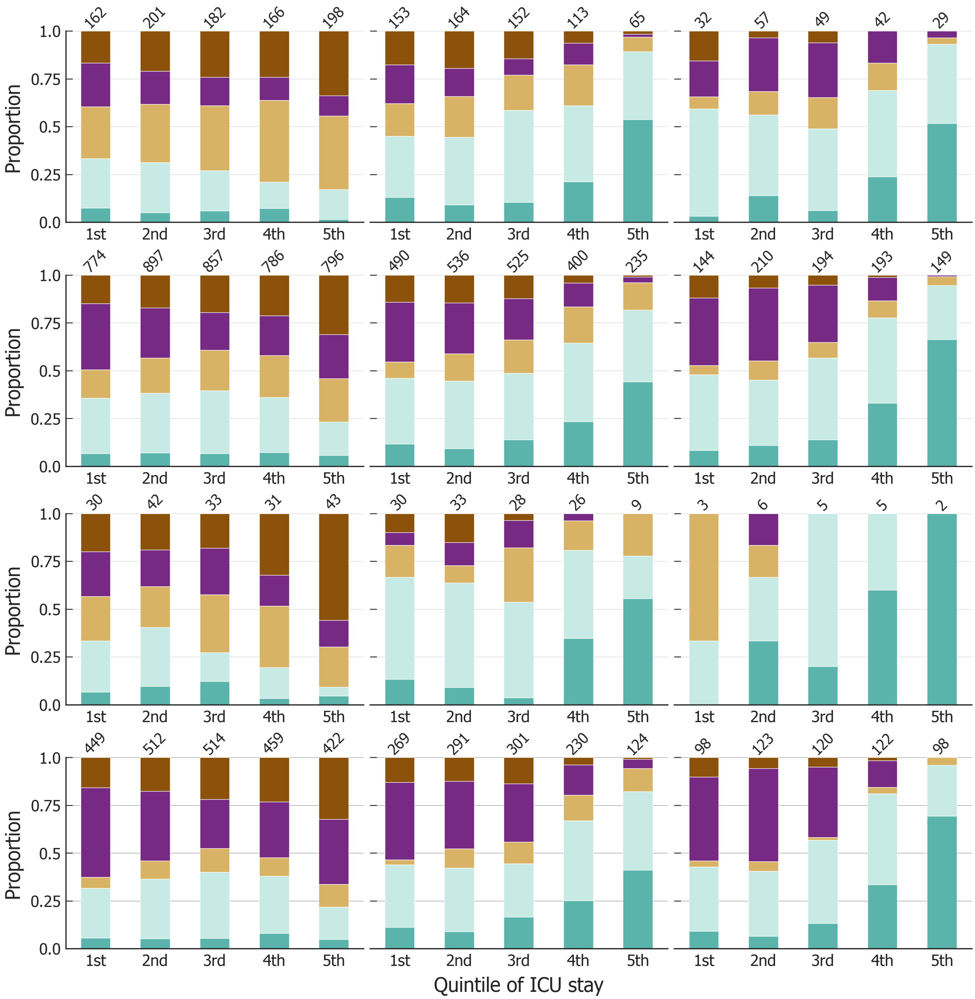

In [124]:
nc = 3
nr = 4
fig, axs = plt.subplots(nr, nc, figsize=plots.stdfigsize(nx=nc, ny=nr), constrained_layout=True)

f1 = out_script.Patient_category=='Other Pneumonia'
f2 = out_script.Episode_etiology!='Bacterial/viral'
df = out_script[f1].groupby(['cpros', 'discharge'], observed=False)['sofs+vtls_pred'].value_counts(normalize=True).unstack()
df1 = out_script[f1].groupby(['cpros', 'discharge'], observed=False)['sofs+vtls_pred'].value_counts().unstack()

for i in range(3):
    df.xs(['Died', 'Other', 'Recovered'][i], level='discharge').plot(
        kind='bar', stacked=True, ax=axs[0,i], legend=False, rot=0,
        color={'C1': '#5ab4ac', 'C2': '#c7eae5', 'C3': '#d8b365', 'C4': '#762a83', 'C5': '#8c510a'}
    )
    axs[0,i].set_xlabel('')
    # axs[0,i].set_title(['Died', 'Other', 'Recovered'][i], fontdict={'fontsize':32})
    axs[0,0].set_ylabel('Proportion', fontsize=40)
    axs[0,i].grid(axis='y') 
    axs[0,i].set_ylim(0,1) 
    axs[0,i].set_yticks(np.arange(0,1.01,0.25))
    axs[0,i].set_yticklabels(np.arange(0,1.01,0.25), fontsize=32)
    
    if i!=0:
        axs[0,i].get_yaxis().set_visible(True)
        axs[0,i].spines['left'].set_visible(False)
        axs[0,i].set_yticks(np.arange(0,1.01,0.25))
        axs[0,i].set_yticklabels(['', '', '', '', ''])
        
    axs[0,i].set_xticklabels(['1st', '2nd', '3rd', '4th', '5th'], fontsize=32)
    # axs[0,1].legend(['D', 'v', 'nv', 'S'], bbox_to_anchor=(0, 1), frameon=False, ncol=4, fontsize=30)

    for ip, p in enumerate(axs[0,i].patches):
        width, height = p.get_width(), p.get_height()
        x, y = p.get_xy() 
        if (ip//5 == 4):
            ann = df1.xs(['Died', 'Other', 'Recovered'][i], level='discharge').sum(axis=1).values[ip%5]
            axs[0,i].text(x+width/2, 1, 
                        '{:n}'.format(ann), 
                        horizontalalignment='center', verticalalignment='bottom', 
                        fontsize=30, rotation=45)
            
df = out_script.groupby(['cpros', 'discharge'], observed=False)['sofs+vtls_pred'].value_counts(normalize=True).unstack()
df1 = out_script.groupby(['cpros', 'discharge'], observed=False)['sofs+vtls_pred'].value_counts().unstack()

for i in range(3):
    df.xs(['Died', 'Other', 'Recovered'][i], level='discharge').plot(
        kind='bar', stacked=True, ax=axs[1,i], legend=False, rot=0, 
        color={'C1': '#5ab4ac', 'C2': '#c7eae5', 'C3': '#d8b365', 'C4': '#762a83', 'C5': '#8c510a'}
    )
    axs[1,i].set_xlabel('')
    # axs[0,i].set_title(['Died', 'Other', 'Recovered'][i], fontdict={'fontsize':32})
    axs[1,0].set_ylabel('Proportion', fontsize=40)
    axs[1,i].grid(axis='y') 
    axs[1,i].set_ylim(0,1) 
    axs[1,i].set_yticks(np.arange(0,1.01,0.25))
    axs[1,i].set_yticklabels(np.arange(0,1.01,0.25), fontsize=32)
    
    if i!=0:
        axs[1,i].get_yaxis().set_visible(True)
        axs[1,i].set_ylabel('')
        axs[1,i].spines['left'].set_visible(False)
        axs[1,i].set_yticks(np.arange(0,1.01,0.25))
        axs[1,i].set_yticklabels(['', '', '', '', ''])
        
    axs[1,i].set_xticklabels(['1st', '2nd', '3rd', '4th', '5th'], fontsize=32)
    for ip, p in enumerate(axs[1,i].patches):
        width, height = p.get_width(), p.get_height()
        x, y = p.get_xy() 
        if (ip//5 == 4):
            ann = df1.xs(['Died', 'Other', 'Recovered'][i], level='discharge').sum(axis=1).values[ip%5]
            axs[1,i].text(x+width/2, 1, 
                        '{:n}'.format(ann), 
                        horizontalalignment='center', verticalalignment='bottom', 
                        fontsize=30, rotation=45)

f1 = out_script.Patient_category.isin(['Other Viral Pneumonia'])
f2 = out_script.Episode_etiology.isin(['Bacterial/viral', 'Viral'])
df = out_script[f1].groupby(['cpros', 'discharge'], observed=False)['sofs+vtls_pred'].value_counts(normalize=True).unstack()
df1 = out_script[f1].groupby(['cpros', 'discharge'], observed=False)['sofs+vtls_pred'].value_counts().unstack()

for i in range(3):
    df.xs(['Died', 'Other', 'Recovered'][i], level='discharge').plot(
        kind='bar', stacked=True, ax=axs[2,i], legend=False, rot=0, 
        color={'C1': '#5ab4ac', 'C2': '#c7eae5', 'C3': '#d8b365', 'C4': '#762a83', 'C5': '#8c510a'}
    )
    axs[2,i].set_xlabel('')
    # axs[0,i].set_title(['Died', 'Other', 'Recovered'][i], fontdict={'fontsize':32})
    axs[2,0].set_ylabel('Proportion', fontsize=40)
    axs[2,i].grid(axis='y') 
    axs[2,i].set_ylim(0,1) 
    axs[2,i].set_yticks(np.arange(0,1.01,0.25))
    axs[2,i].set_yticklabels(np.arange(0,1.01,0.25), fontsize=32)
    
    if i!=0:
        axs[2,i].get_yaxis().set_visible(True)
        axs[2,i].set_ylabel('')
        axs[2,i].spines['left'].set_visible(False)
        axs[2,i].set_yticks(np.arange(0,1.01,0.25))
        axs[2,i].set_yticklabels(['', '', '', '', ''])
        
    axs[2,i].set_xticklabels(['1st', '2nd', '3rd', '4th', '5th'], fontsize=32)
    for ip, p in enumerate(axs[2,i].patches):
        width, height = p.get_width(), p.get_height()
        x, y = p.get_xy() 
        if (ip//5 == 4):
            ann = df1.xs(['Died', 'Other', 'Recovered'][i], level='discharge').sum(axis=1).values[ip%5]
            axs[2,i].text(x+width/2, 1, 
                        '{:n}'.format(ann), 
                        horizontalalignment='center', verticalalignment='bottom', 
                        fontsize=30, rotation=45)
            
f1 = out_script.Patient_category=='COVID-19'
f2 = out_script.Episode_etiology.isin(['Bacterial/viral', 'Viral'])
df = out_script[f1].groupby(['cpros', 'discharge'], observed=False)['sofs+vtls_pred'].value_counts(normalize=True).unstack()
df1 = out_script[f1].groupby(['cpros', 'discharge'], observed=False)['sofs+vtls_pred'].value_counts().unstack()

for i in range(3):
    df.xs(['Died', 'Other', 'Recovered'][i], level='discharge').plot(
        kind='bar', stacked=True, ax=axs[3,i], legend=False, rot=0, 
        color={'C1': '#5ab4ac', 'C2': '#c7eae5', 'C3': '#d8b365', 'C4': '#762a83', 'C5': '#8c510a'}
    )
    if i==1:
        axs[3,i].set_xlabel('Quintile of ICU stay', fontsize=40)
    else:
        axs[3,i].set_xlabel('')
    
    axs[3,0].set_ylabel('Proportion', fontsize=40)
    axs[3,i].grid(axis='y', c='Gray') 
    axs[3,i].set_ylim(0,1)
    axs[3,i].set_yticks(np.arange(0,1.01,0.25))
    axs[3,i].set_yticklabels(np.arange(0,1.01,0.25), fontsize=32)
    
    if i!=0:
        axs[3,i].get_yaxis().set_visible(True)
        axs[3,i].spines['left'].set_visible(False)
        axs[3,i].set_yticks(np.arange(0,1.01,0.25))
        axs[3,i].set_yticklabels(['', '', '', '', ''])
        
    axs[3,i].set_xticklabels(['1st', '2nd', '3rd', '4th', '5th'], fontsize=32)
    for ip, p in enumerate(axs[3,i].patches):
        width, height = p.get_width(), p.get_height()
        x, y = p.get_xy() 
        if (ip//5 == 4):
            ann = df1.xs(['Died', 'Other', 'Recovered'][i], level='discharge').sum(axis=1).values[ip%5]
            axs[3,i].text(x+width/2, 1, 
                        '{:n}'.format(ann), 
                        horizontalalignment='center', verticalalignment='bottom', 
                        fontsize=30, rotation=45)
# axs[0,1].legend(['C1', 'C2', 'C3', 'C4', 'C5'], bbox_to_anchor=(.5, 1.2), frameon=False, ncol=5, fontsize=30)

In [125]:
out_script.groupby('Patient_category').Episode_etiology.value_counts(dropna=False).unstack().fillna(0)

Episode_etiology,Bacterial,Bacterial/viral,Culture-negative,Indeterminate,Viral,NaN
Patient_category,,,,,,
COVID-19,532.0,1556.0,60.0,0.0,1378.0,2297.0
Non-Pneumonia Control,241.0,0.0,42.0,0.0,0.0,1359.0
Other Pneumonia,1182.0,20.0,698.0,31.0,0.0,2324.0
Other Viral Pneumonia,26.0,117.0,8.0,0.0,317.0,307.0


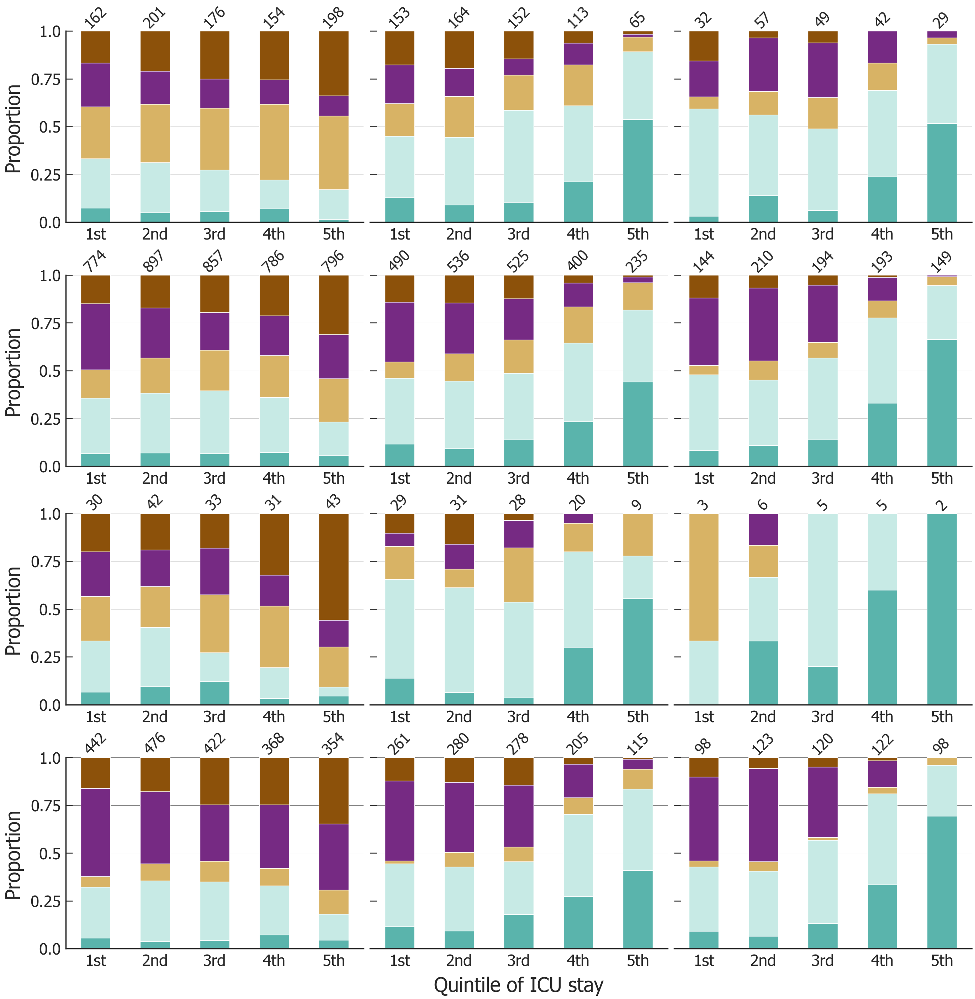

In [126]:
nc = 3
nr = 4
fig, axs = plt.subplots(nr, nc, figsize=plots.stdfigsize(nx=nc, ny=nr), constrained_layout=True)

f1 = out_script.Patient_category=='Other Pneumonia'
f2 = out_script.Episode_etiology!='Bacterial/viral'
df = out_script[f1&f2].groupby(['cpros', 'discharge'], observed=False)['sofs+vtls_pred'].value_counts(normalize=True).unstack()
df1 = out_script[f1&f2].groupby(['cpros', 'discharge'], observed=False)['sofs+vtls_pred'].value_counts().unstack()

for i in range(3):
    df.xs(['Died', 'Other', 'Recovered'][i], level='discharge').plot(
        kind='bar', stacked=True, ax=axs[0,i], legend=False, rot=0,
        color={'C1': '#5ab4ac', 'C2': '#c7eae5', 'C3': '#d8b365', 'C4': '#762a83', 'C5': '#8c510a'}
    )
    axs[0,i].set_xlabel('')
    # axs[0,i].set_title(['Died', 'Other', 'Recovered'][i], fontdict={'fontsize':32})
    axs[0,0].set_ylabel('Proportion', fontsize=40)
    axs[0,i].grid(axis='y') 
    axs[0,i].set_ylim(0,1) 
    axs[0,i].set_yticks(np.arange(0,1.01,0.25))
    axs[0,i].set_yticklabels(np.arange(0,1.01,0.25), fontsize=32)
    
    if i!=0:
        axs[0,i].get_yaxis().set_visible(True)
        axs[0,i].spines['left'].set_visible(False)
        axs[0,i].set_yticks(np.arange(0,1.01,0.25))
        axs[0,i].set_yticklabels(['', '', '', '', ''])
        
    axs[0,i].set_xticklabels(['1st', '2nd', '3rd', '4th', '5th'], fontsize=32)
    # axs[0,1].legend(['D', 'v', 'nv', 'S'], bbox_to_anchor=(0, 1), frameon=False, ncol=4, fontsize=30)

    for ip, p in enumerate(axs[0,i].patches):
        width, height = p.get_width(), p.get_height()
        x, y = p.get_xy() 
        if (ip//5 == 4):
            ann = df1.xs(['Died', 'Other', 'Recovered'][i], level='discharge').sum(axis=1).values[ip%5]
            axs[0,i].text(x+width/2, 1, 
                        '{:n}'.format(ann), 
                        horizontalalignment='center', verticalalignment='bottom', 
                        fontsize=30, rotation=45)
            
df = out_script.groupby(['cpros', 'discharge'], observed=False)['sofs+vtls_pred'].value_counts(normalize=True).unstack()
df1 = out_script.groupby(['cpros', 'discharge'], observed=False)['sofs+vtls_pred'].value_counts().unstack()

for i in range(3):
    df.xs(['Died', 'Other', 'Recovered'][i], level='discharge').plot(
        kind='bar', stacked=True, ax=axs[1,i], legend=False, rot=0, 
        color={'C1': '#5ab4ac', 'C2': '#c7eae5', 'C3': '#d8b365', 'C4': '#762a83', 'C5': '#8c510a'}
    )
    axs[1,i].set_xlabel('')
    # axs[0,i].set_title(['Died', 'Other', 'Recovered'][i], fontdict={'fontsize':32})
    axs[1,0].set_ylabel('Proportion', fontsize=40)
    axs[1,i].grid(axis='y') 
    axs[1,i].set_ylim(0,1) 
    axs[1,i].set_yticks(np.arange(0,1.01,0.25))
    axs[1,i].set_yticklabels(np.arange(0,1.01,0.25), fontsize=32)
    
    if i!=0:
        axs[1,i].get_yaxis().set_visible(True)
        axs[1,i].set_ylabel('')
        axs[1,i].spines['left'].set_visible(False)
        axs[1,i].set_yticks(np.arange(0,1.01,0.25))
        axs[1,i].set_yticklabels(['', '', '', '', ''])
        
    axs[1,i].set_xticklabels(['1st', '2nd', '3rd', '4th', '5th'], fontsize=32)
    for ip, p in enumerate(axs[1,i].patches):
        width, height = p.get_width(), p.get_height()
        x, y = p.get_xy() 
        if (ip//5 == 4):
            ann = df1.xs(['Died', 'Other', 'Recovered'][i], level='discharge').sum(axis=1).values[ip%5]
            axs[1,i].text(x+width/2, 1, 
                        '{:n}'.format(ann), 
                        horizontalalignment='center', verticalalignment='bottom', 
                        fontsize=30, rotation=45)

f1 = out_script.Patient_category.isin(['Other Viral Pneumonia'])
f2 = out_script.Episode_etiology!='Bacterial'
df = out_script[f1&f2].groupby(['cpros', 'discharge'], observed=False)['sofs+vtls_pred'].value_counts(normalize=True).unstack()
df1 = out_script[f1&f2].groupby(['cpros', 'discharge'], observed=False)['sofs+vtls_pred'].value_counts().unstack()

for i in range(3):
    df.xs(['Died', 'Other', 'Recovered'][i], level='discharge').plot(
        kind='bar', stacked=True, ax=axs[2,i], legend=False, rot=0, 
        color={'C1': '#5ab4ac', 'C2': '#c7eae5', 'C3': '#d8b365', 'C4': '#762a83', 'C5': '#8c510a'}
    )
    axs[2,i].set_xlabel('')
    # axs[0,i].set_title(['Died', 'Other', 'Recovered'][i], fontdict={'fontsize':32})
    axs[2,0].set_ylabel('Proportion', fontsize=40)
    axs[2,i].grid(axis='y') 
    axs[2,i].set_ylim(0,1) 
    axs[2,i].set_yticks(np.arange(0,1.01,0.25))
    axs[2,i].set_yticklabels(np.arange(0,1.01,0.25), fontsize=32)
    
    if i!=0:
        axs[2,i].get_yaxis().set_visible(True)
        axs[2,i].set_ylabel('')
        axs[2,i].spines['left'].set_visible(False)
        axs[2,i].set_yticks(np.arange(0,1.01,0.25))
        axs[2,i].set_yticklabels(['', '', '', '', ''])
        
    axs[2,i].set_xticklabels(['1st', '2nd', '3rd', '4th', '5th'], fontsize=32)
    for ip, p in enumerate(axs[2,i].patches):
        width, height = p.get_width(), p.get_height()
        x, y = p.get_xy() 
        if (ip//5 == 4):
            ann = df1.xs(['Died', 'Other', 'Recovered'][i], level='discharge').sum(axis=1).values[ip%5]
            axs[2,i].text(x+width/2, 1, 
                        '{:n}'.format(ann), 
                        horizontalalignment='center', verticalalignment='bottom', 
                        fontsize=30, rotation=45)
            
f1 = out_script.Patient_category=='COVID-19'
f2 = out_script.Episode_etiology!='Bacterial'
df = out_script[f1&f2].groupby(['cpros', 'discharge'], observed=False)['sofs+vtls_pred'].value_counts(normalize=True).unstack()
df1 = out_script[f1&f2].groupby(['cpros', 'discharge'], observed=False)['sofs+vtls_pred'].value_counts().unstack()

for i in range(3):
    df.xs(['Died', 'Other', 'Recovered'][i], level='discharge').plot(
        kind='bar', stacked=True, ax=axs[3,i], legend=False, rot=0, 
        color={'C1': '#5ab4ac', 'C2': '#c7eae5', 'C3': '#d8b365', 'C4': '#762a83', 'C5': '#8c510a'}
    )
    if i==1:
        axs[3,i].set_xlabel('Quintile of ICU stay', fontsize=40)
    else:
        axs[3,i].set_xlabel('')
    
    axs[3,0].set_ylabel('Proportion', fontsize=40)
    axs[3,i].grid(axis='y', c='Gray') 
    axs[3,i].set_ylim(0,1)
    axs[3,i].set_yticks(np.arange(0,1.01,0.25))
    axs[3,i].set_yticklabels(np.arange(0,1.01,0.25), fontsize=32)
    
    if i!=0:
        axs[3,i].get_yaxis().set_visible(True)
        axs[3,i].spines['left'].set_visible(False)
        axs[3,i].set_yticks(np.arange(0,1.01,0.25))
        axs[3,i].set_yticklabels(['', '', '', '', ''])
        
    axs[3,i].set_xticklabels(['1st', '2nd', '3rd', '4th', '5th'], fontsize=32)
    for ip, p in enumerate(axs[3,i].patches):
        width, height = p.get_width(), p.get_height()
        x, y = p.get_xy() 
        if (ip//5 == 4):
            ann = df1.xs(['Died', 'Other', 'Recovered'][i], level='discharge').sum(axis=1).values[ip%5]
            axs[3,i].text(x+width/2, 1, 
                        '{:n}'.format(ann), 
                        horizontalalignment='center', verticalalignment='bottom', 
                        fontsize=30, rotation=45)

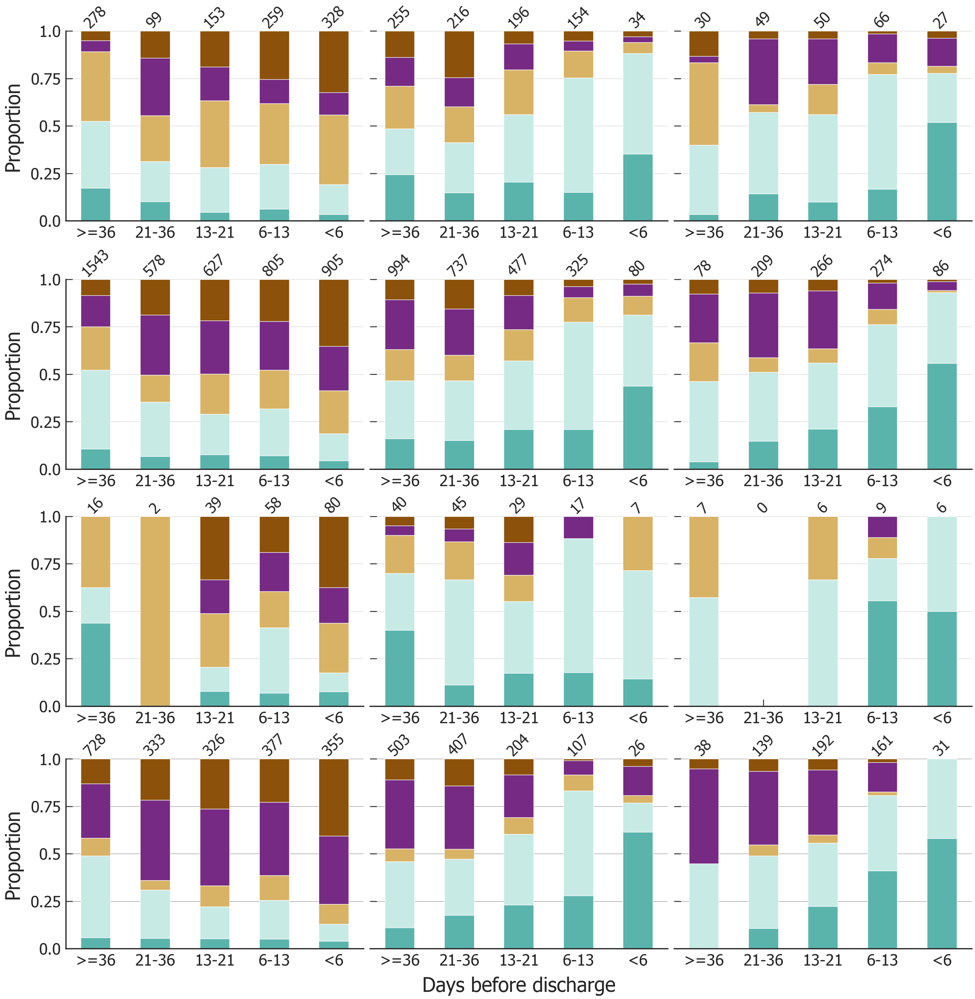

In [127]:
nc = 3
nr = 4
fig, axs = plt.subplots(nr, nc, figsize=plots.stdfigsize(nx=nc, ny=nr), constrained_layout=True)

f1 = out_script.Patient_category=='Other Pneumonia'
f2 = out_script.Episode_etiology!='Bacterial/viral'
df = out_script[f1&f2].groupby(['days_to_discharge_binned', 'discharge'], observed=False)['sofs+vtls_pred'].value_counts(normalize=True).unstack()
df1 = out_script[f1&f2].groupby(['days_to_discharge_binned', 'discharge'], observed=False)['sofs+vtls_pred'].value_counts().unstack()

for i in range(3):
    df.xs(['Died', 'Other', 'Recovered'][i], level='discharge').plot(
        kind='bar', stacked=True, ax=axs[0,i], legend=False, rot=0,
        color={'C1': '#5ab4ac', 'C2': '#c7eae5', 'C3': '#d8b365', 'C4': '#762a83', 'C5': '#8c510a'}
    )
    axs[0,i].set_xlabel('')
    # axs[0,i].set_title(['Died', 'Other', 'Recovered'][i], fontdict={'fontsize':32})
    axs[0,0].set_ylabel('Proportion', fontsize=40)
    axs[0,i].grid(axis='y') 
    axs[0,i].set_ylim(0,1) 
    axs[0,i].set_yticks(np.arange(0,1.01,0.25))
    axs[0,i].set_yticklabels(np.arange(0,1.01,0.25), fontsize=32)
    
    if i!=0:
        axs[0,i].get_yaxis().set_visible(True)
        axs[0,i].spines['left'].set_visible(False)
        axs[0,i].set_yticks(np.arange(0,1.01,0.25))
        axs[0,i].set_yticklabels(['', '', '', '', ''])
        
    axs[0,i].set_xticklabels(['>=36', '21-36', '13-21', '6-13', '<6'], fontsize=32, rotation=0)
    # axs[0,1].legend(['D', 'v', 'nv', 'S'], bbox_to_anchor=(0, 1), frameon=False, ncol=4, fontsize=30)

    for ip, p in enumerate(axs[0,i].patches):
        width, height = p.get_width(), p.get_height()
        x, y = p.get_xy() 
        if (ip//5 == 4):
            ann = df1.xs(['Died', 'Other', 'Recovered'][i], level='discharge').sum(axis=1).values[ip%5]
            axs[0,i].text(x+width/2, 1, 
                        '{:n}'.format(ann), 
                        horizontalalignment='center', verticalalignment='bottom', 
                        fontsize=30, rotation=45)
            
df = out_script.groupby(['days_to_discharge_binned', 'discharge'], observed=False)['sofs+vtls_pred'].value_counts(normalize=True).unstack()
df1 = out_script.groupby(['days_to_discharge_binned', 'discharge'], observed=False)['sofs+vtls_pred'].value_counts().unstack()

for i in range(3):
    df.xs(['Died', 'Other', 'Recovered'][i], level='discharge').plot(
        kind='bar', stacked=True, ax=axs[1,i], legend=False, rot=0, 
        color={'C1': '#5ab4ac', 'C2': '#c7eae5', 'C3': '#d8b365', 'C4': '#762a83', 'C5': '#8c510a'}
    )
    axs[1,i].set_xlabel('')
    # axs[0,i].set_title(['Died', 'Other', 'Recovered'][i], fontdict={'fontsize':32})
    axs[1,0].set_ylabel('Proportion', fontsize=40)
    axs[1,i].grid(axis='y') 
    axs[1,i].set_ylim(0,1) 
    axs[1,i].set_yticks(np.arange(0,1.01,0.25))
    axs[1,i].set_yticklabels(np.arange(0,1.01,0.25), fontsize=32)
    
    if i!=0:
        axs[1,i].get_yaxis().set_visible(True)
        axs[1,i].set_ylabel('')
        axs[1,i].spines['left'].set_visible(False)
        axs[1,i].set_yticks(np.arange(0,1.01,0.25))
        axs[1,i].set_yticklabels(['', '', '', '', ''])
        
    axs[1,i].set_xticklabels(['>=36', '21-36', '13-21', '6-13', '<6'], fontsize=32)
    for ip, p in enumerate(axs[1,i].patches):
        width, height = p.get_width(), p.get_height()
        x, y = p.get_xy() 
        if (ip//5 == 4):
            ann = df1.xs(['Died', 'Other', 'Recovered'][i], level='discharge').sum(axis=1).values[ip%5]
            axs[1,i].text(x+width/2, 1, 
                        '{:n}'.format(ann), 
                        horizontalalignment='center', verticalalignment='bottom', 
                        fontsize=30, rotation=45)

f1 = out_script.Patient_category.isin(['Other Viral Pneumonia'])
f2 = out_script.Episode_etiology!='Bacterial'
df = out_script[f1&f2].groupby(['days_to_discharge_binned', 'discharge'], observed=False)['sofs+vtls_pred'].value_counts(normalize=True).unstack()
df1 = out_script[f1&f2].groupby(['days_to_discharge_binned', 'discharge'], observed=False)['sofs+vtls_pred'].value_counts().unstack()

for i in range(3):
    df.xs(['Died', 'Other', 'Recovered'][i], level='discharge').plot(
        kind='bar', stacked=True, ax=axs[2,i], legend=False, rot=0, 
        color={'C1': '#5ab4ac', 'C2': '#c7eae5', 'C3': '#d8b365', 'C4': '#762a83', 'C5': '#8c510a'}
    )
    axs[2,i].set_xlabel('')
    # axs[0,i].set_title(['Died', 'Other', 'Recovered'][i], fontdict={'fontsize':32})
    axs[2,0].set_ylabel('Proportion', fontsize=40)
    axs[2,i].grid(axis='y') 
    axs[2,i].set_ylim(0,1) 
    axs[2,i].set_yticks(np.arange(0,1.01,0.25))
    axs[2,i].set_yticklabels(np.arange(0,1.01,0.25), fontsize=32)
    
    if i!=0:
        axs[2,i].get_yaxis().set_visible(True)
        axs[2,i].set_ylabel('')
        axs[2,i].spines['left'].set_visible(False)
        axs[2,i].set_yticks(np.arange(0,1.01,0.25))
        axs[2,i].set_yticklabels(['', '', '', '', ''])
        
    axs[2,i].set_xticklabels(['>=36', '21-36', '13-21', '6-13', '<6'], fontsize=32)
    for ip, p in enumerate(axs[2,i].patches):
        width, height = p.get_width(), p.get_height()
        x, y = p.get_xy() 
        if (ip//5 == 4):
            ann = df1.xs(['Died', 'Other', 'Recovered'][i], level='discharge').sum(axis=1).values[ip%5]
            axs[2,i].text(x+width/2, 1, 
                        '{:n}'.format(ann), 
                        horizontalalignment='center', verticalalignment='bottom', 
                        fontsize=30, rotation=45)

f1 = out_script.Patient_category=='COVID-19'
f2 = out_script.Episode_etiology!='Bacterial'
df = out_script[f1&f2].groupby(['days_to_discharge_binned', 'discharge'], observed=False)['sofs+vtls_pred'].value_counts(normalize=True).unstack()
df1 = out_script[f1&f2].groupby(['days_to_discharge_binned', 'discharge'], observed=False)['sofs+vtls_pred'].value_counts().unstack()

for i in range(3):
    df.xs(['Died', 'Other', 'Recovered'][i], level='discharge').plot(
        kind='bar', stacked=True, ax=axs[3,i], legend=False, rot=0, 
        color={'C1': '#5ab4ac', 'C2': '#c7eae5', 'C3': '#d8b365', 'C4': '#762a83', 'C5': '#8c510a'}
    )
    if i==1:
        axs[3,i].set_xlabel('Days before discharge', fontsize=40)
    else:
        axs[3,i].set_xlabel('')
    
    axs[3,0].set_ylabel('Proportion', fontsize=40)
    axs[3,i].grid(axis='y', c='Gray') 
    axs[3,i].set_ylim(0,1)
    axs[3,i].set_yticks(np.arange(0,1.01,0.25))
    axs[3,i].set_yticklabels(np.arange(0,1.01,0.25), fontsize=32)
    
    if i!=0:
        axs[3,i].get_yaxis().set_visible(True)
        axs[3,i].spines['left'].set_visible(False)
        axs[3,i].set_yticks(np.arange(0,1.01,0.25))
        axs[3,i].set_yticklabels(['', '', '', '', ''])
        
    axs[3,i].set_xticklabels(['>=36', '21-36', '13-21', '6-13', '<6'], fontsize=32)
    for ip, p in enumerate(axs[3,i].patches):
        width, height = p.get_width(), p.get_height()
        x, y = p.get_xy() 
        if (ip//5 == 4):
            ann = df1.xs(['Died', 'Other', 'Recovered'][i], level='discharge').sum(axis=1).values[ip%5]
            axs[3,i].text(x+width/2, 1, 
                        '{:n}'.format(ann), 
                        horizontalalignment='center', verticalalignment='bottom', 
                        fontsize=30, rotation=45)

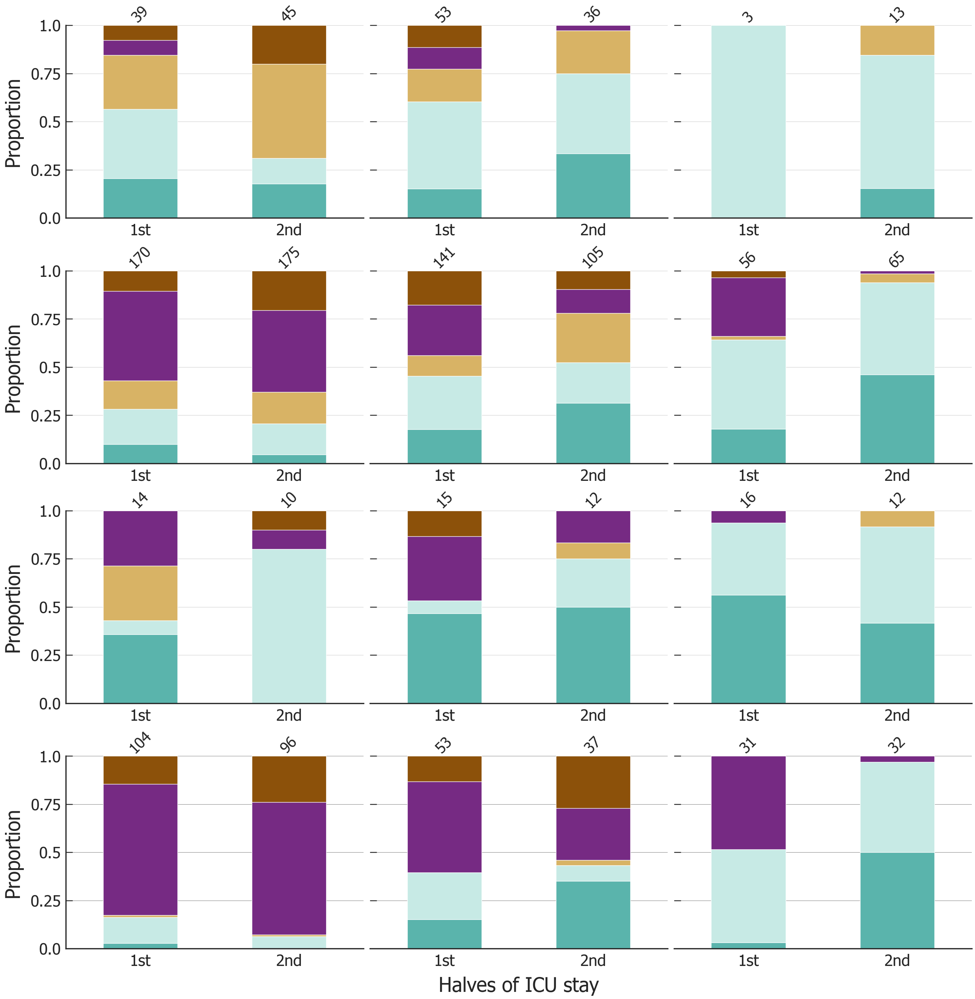

In [128]:
nc = 3
nr = 4
fig, axs = plt.subplots(nr, nc, figsize=plots.stdfigsize(nx=nc, ny=nr), constrained_layout=True)

f1 = out_script_test.Patient_category=='Other Pneumonia'
f2 = out_script_test.Episode_etiology!='Bacterial/viral'
df = out_script_test[f1&f2].groupby(['cpros', 'discharge'], observed=False)['sofs+vtls_pred'].value_counts(normalize=True).unstack()
df1 = out_script_test[f1&f2].groupby(['cpros', 'discharge'], observed=False)['sofs+vtls_pred'].value_counts().unstack()

for i in range(3):
    df.xs(['Died', 'Other', 'Recovered'][i], level='discharge').plot(
        kind='bar', stacked=True, ax=axs[0,i], legend=False, rot=0,
        color={'C1': '#5ab4ac', 'C2': '#c7eae5', 'C3': '#d8b365', 'C4': '#762a83', 'C5': '#8c510a'}
    )
    axs[0,i].set_xlabel('')
    # axs[0,i].set_title(['Died', 'Other', 'Recovered'][i], fontdict={'fontsize':32})
    axs[0,0].set_ylabel('Proportion', fontsize=40)
    axs[0,i].grid(axis='y') 
    axs[0,i].set_ylim(0,1) 
    axs[0,i].set_yticks(np.arange(0,1.01,0.25))
    axs[0,i].set_yticklabels(np.arange(0,1.01,0.25), fontsize=32)
    
    if i!=0:
        axs[0,i].get_yaxis().set_visible(True)
        axs[0,i].spines['left'].set_visible(False)
        axs[0,i].set_yticks(np.arange(0,1.01,0.25))
        axs[0,i].set_yticklabels(['', '', '', '', ''])
        
    axs[0,i].set_xticklabels(['1st', '2nd'], fontsize=32)
    # axs[0,1].legend(['D', 'v', 'nv', 'S'], bbox_to_anchor=(0, 1), frameon=False, ncol=4, fontsize=30)

    for ip, p in enumerate(axs[0,i].patches):
        width, height = p.get_width(), p.get_height()
        x, y = p.get_xy() 
        if (ip//2 == 4):
            ann = df1.xs(['Died', 'Other', 'Recovered'][i], level='discharge').sum(axis=1).values[ip%2]
            axs[0,i].text(x+width/2, 1, 
                        '{:n}'.format(ann), 
                        horizontalalignment='center', verticalalignment='bottom', 
                        fontsize=30, rotation=45)
            
df = out_script_test.groupby(['cpros', 'discharge'], observed=False)['sofs+vtls_pred'].value_counts(normalize=True).unstack()
df1 = out_script_test.groupby(['cpros', 'discharge'], observed=False)['sofs+vtls_pred'].value_counts().unstack()

for i in range(3):
    df.xs(['Died', 'Other', 'Recovered'][i], level='discharge').plot(
        kind='bar', stacked=True, ax=axs[1,i], legend=False, rot=0, 
        color={'C1': '#5ab4ac', 'C2': '#c7eae5', 'C3': '#d8b365', 'C4': '#762a83', 'C5': '#8c510a'}
    )
    axs[1,i].set_xlabel('')
    # axs[0,i].set_title(['Died', 'Other', 'Recovered'][i], fontdict={'fontsize':32})
    axs[1,0].set_ylabel('Proportion', fontsize=40)
    axs[1,i].grid(axis='y') 
    axs[1,i].set_ylim(0,1) 
    axs[1,i].set_yticks(np.arange(0,1.01,0.25))
    axs[1,i].set_yticklabels(np.arange(0,1.01,0.25), fontsize=32)
    
    if i!=0:
        axs[1,i].get_yaxis().set_visible(True)
        axs[1,i].set_ylabel('')
        axs[1,i].spines['left'].set_visible(False)
        axs[1,i].set_yticks(np.arange(0,1.01,0.25))
        axs[1,i].set_yticklabels(['', '', '', '', ''])
        
    axs[1,i].set_xticklabels(['1st', '2nd'], fontsize=32)
    for ip, p in enumerate(axs[1,i].patches):
        width, height = p.get_width(), p.get_height()
        x, y = p.get_xy() 
        if (ip//2 == 4):
            ann = df1.xs(['Died', 'Other', 'Recovered'][i], level='discharge').sum(axis=1).values[ip%2]
            axs[1,i].text(x+width/2, 1, 
                        '{:n}'.format(ann), 
                        horizontalalignment='center', verticalalignment='bottom', 
                        fontsize=30, rotation=45)
            
f1 = out_script_test.Patient_category.isin(['Other Viral Pneumonia'])
f2 = out_script_test.Episode_etiology!='Bacterial'
df = out_script_test[f1&f2].groupby(['cpros', 'discharge'], observed=False)['sofs+vtls_pred'].value_counts(normalize=True).unstack()
df1 = out_script_test[f1&f2].groupby(['cpros', 'discharge'], observed=False)['sofs+vtls_pred'].value_counts().unstack()

for i in range(3):
    df.xs(['Died', 'Other', 'Recovered'][i], level='discharge').plot(
        kind='bar', stacked=True, ax=axs[2,i], legend=False, rot=0, 
        color={'C1': '#5ab4ac', 'C2': '#c7eae5', 'C3': '#d8b365', 'C4': '#762a83', 'C5': '#8c510a'}
    )
    axs[2,i].set_xlabel('')
    # axs[0,i].set_title(['Died', 'Other', 'Recovered'][i], fontdict={'fontsize':32})
    axs[2,0].set_ylabel('Proportion', fontsize=40)
    axs[2,i].grid(axis='y') 
    axs[2,i].set_ylim(0,1) 
    axs[2,i].set_yticks(np.arange(0,1.01,0.25))
    axs[2,i].set_yticklabels(np.arange(0,1.01,0.25), fontsize=32)
    
    if i!=0:
        axs[2,i].get_yaxis().set_visible(True)
        axs[2,i].set_ylabel('')
        axs[2,i].spines['left'].set_visible(False)
        axs[2,i].set_yticks(np.arange(0,1.01,0.25))
        axs[2,i].set_yticklabels(['', '', '', '', ''])
        
    axs[2,i].set_xticklabels(['1st', '2nd'], fontsize=32)
    for ip, p in enumerate(axs[2,i].patches):
        width, height = p.get_width(), p.get_height()
        x, y = p.get_xy() 
        if (ip//2 == 4):
            ann = df1.xs(['Died', 'Other', 'Recovered'][i], level='discharge').sum(axis=1).values[ip%2]
            axs[2,i].text(x+width/2, 1, 
                        '{:n}'.format(ann), 
                        horizontalalignment='center', verticalalignment='bottom', 
                        fontsize=30, rotation=45)
            
f1 = out_script_test.Patient_category=='COVID-19'
f2 = out_script_test.Episode_etiology!='Bacterial'
df = out_script_test[f1&f2].groupby(['cpros', 'discharge'], observed=False)['sofs+vtls_pred'].value_counts(normalize=True).unstack()
df1 = out_script_test[f1&f2].groupby(['cpros', 'discharge'], observed=False)['sofs+vtls_pred'].value_counts().unstack()

for i in range(3):
    df.xs(['Died', 'Other', 'Recovered'][i], level='discharge').plot(
        kind='bar', stacked=True, ax=axs[3,i], legend=False, rot=0, 
        color={'C1': '#5ab4ac', 'C2': '#c7eae5', 'C3': '#d8b365', 'C4': '#762a83', 'C5': '#8c510a'}
    )
    if i==1:
        axs[3,i].set_xlabel('Halves of ICU stay', fontsize=40)
    else:
        axs[3,i].set_xlabel('')
    
    axs[3,0].set_ylabel('Proportion', fontsize=40)
    axs[3,i].grid(axis='y', c='Gray') 
    axs[3,i].set_ylim(0,1)
    axs[3,i].set_yticks(np.arange(0,1.01,0.25))
    axs[3,i].set_yticklabels(np.arange(0,1.01,0.25), fontsize=32)
    
    if i!=0:
        axs[3,i].get_yaxis().set_visible(True)
        axs[3,i].spines['left'].set_visible(False)
        axs[3,i].set_yticks(np.arange(0,1.01,0.25))
        axs[3,i].set_yticklabels(['', '', '', '', ''])
        
    axs[3,i].set_xticklabels(['1st', '2nd'], fontsize=32)
    for ip, p in enumerate(axs[3,i].patches):
        width, height = p.get_width(), p.get_height()
        x, y = p.get_xy() 
        if (ip//2 == 4):
            ann = df1.xs(['Died', 'Other', 'Recovered'][i], level='discharge').sum(axis=1).values[ip%2]
            axs[3,i].text(x+width/2, 1, 
                        '{:n}'.format(ann), 
                        horizontalalignment='center', verticalalignment='bottom', 
                        fontsize=30, rotation=45)

# mimic

## mimic on scriptPCA

### sofs

In [129]:
dfs = []
for filename in os.listdir(os.path.join(dp_dir, 'mimic_on_scriptPCA')):
    if filename.startswith('mimic_')&any(pc in filename for pc in ['2PC', '4PC', '5PC']):
        parts = filename.replace('mimic_', '').replace('.csv', '').split('_')
        # print(parts)
        feature_set = parts[0]
        scaler_name = parts[1]
        n_pc = parts[2].replace('PC', '')
        boot = parts[-1].replace('boot', '').replace('pdist', 'all')

        file_path = os.path.join(dp_dir, 'mimic_on_scriptPCA', filename)

        df = pd.read_csv(file_path, index_col=0)
        df['dataset'] = 'carpediem'
        df['feature_set'] = feature_set
        df['n_pc'] = n_pc
        df['boot'] = boot

        dfs.append(df)
        # break
    # break


In [130]:
dps = pd.concat(dfs, ignore_index=True)
# dps.drop(columns=['index'], inplace=True)

In [131]:
f1 = dps.feature_set == 'sofs'
f2 = dps.boot == '2PC'
sls = []
for n_cmp in np.arange(2,15):
    cc = dps[f1].sort_values('rd', ascending=False).iloc[:n_cmp*101,3:5]
    cc = cc.drop_duplicates()
    print(cc.shape)
    kms = [KMeans(n_clusters=nn, random_state=0, n_init=5).fit(cc.values) for nn in np.arange(2,min(15, len(cc)))]
    sls.append([silhouette_score(cc, km.labels_) for km in kms])
    # break

(4, 2)
(4, 2)
(6, 2)
(7, 2)
(8, 2)
(10, 2)
(13, 2)
(14, 2)
(19, 2)
(19, 2)
(23, 2)
(25, 2)
(27, 2)


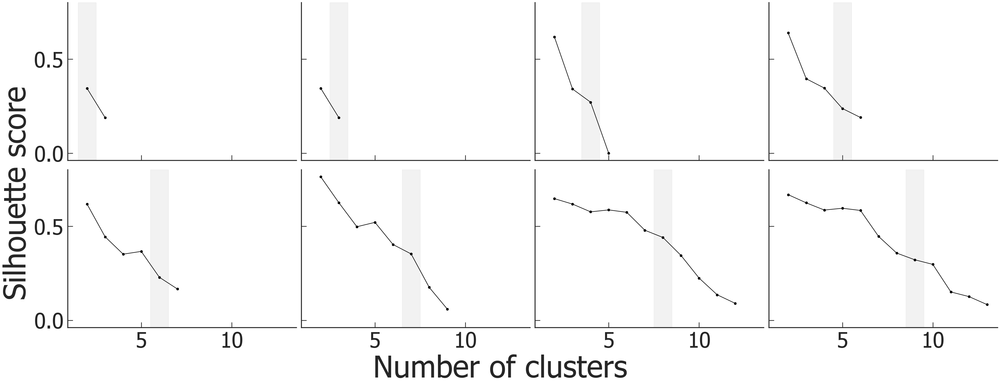

In [132]:
nc = 4
nr = 2
fig, axs = plt.subplots(nr, nc, figsize=plots.stdfigsize(nx=nc, ny=nr), constrained_layout=True, sharex=True, sharey=True)

for i in range(nr*nc):
    axs[i//nc, i%nc].plot(np.arange(2,len(sls[i])+2), sls[i], marker='o', color='k')
    axs[i//nc, i%nc].axvspan(i+1.5,i+2.5, color='gray', alpha=0.1)
    axs[i//nc, i%nc].tick_params(axis='both', which='major', labelsize=56)

fig.supxlabel('Number of clusters', ha='center', fontsize=80)
fig.supylabel('Silhouette score', va='center', fontsize=80)
plt.show()

In [133]:
n_cmp = 2
cc = dps[f1].sort_values('rd', ascending=False).iloc[:n_cmp*101,3:5]
kms = KMeans(n_clusters=n_cmp, random_state=0, n_init=5).fit(cc.values)

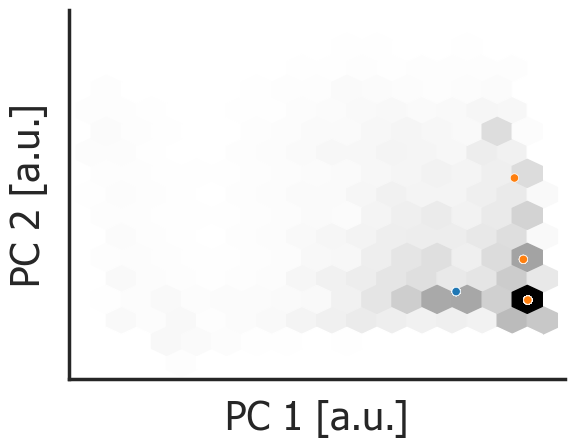

In [134]:
f1 = dps.feature_set == 'sofs'
f2 = dps.boot=='2PC'
# plt.figure(figsize=plots.stdfigsize(nx=1, ratio=1))
plt.hexbin(dps[f1 & f2].loc[:,'PC1'], dps[f1 & f2].loc[:,'PC2'], cmap='gray_r', zorder=1, gridsize=15)
sns.scatterplot(data=cc, x='PC1', y='PC2', hue=kms.labels_, zorder=2, legend=False, palette='tab10')
plt.xticks([])
plt.yticks([])
plt.xlabel('PC 1 [a.u.]')
plt.ylabel('PC 2 [a.u.]')
plt.show()

### sofs+vtls

In [135]:
f1 = dps.feature_set == 'sofs+vtls'
f2 = dps.boot == '4PC'
sls = []
for n_cmp in np.arange(2,15):
    cc = dps[f1].sort_values('rd', ascending=False).iloc[:n_cmp*101,3:7]
    cc = cc.drop_duplicates()
    print(cc.shape)
    kms = [KMeans(n_clusters=nn, random_state=0, n_init=5).fit(cc.values) for nn in np.arange(2,min(15, len(cc)))]
    sls.append([silhouette_score(cc, km.labels_) for km in kms])
    # break

(76, 4)
(105, 4)
(142, 4)
(168, 4)
(211, 4)
(247, 4)
(269, 4)
(291, 4)
(323, 4)
(351, 4)
(379, 4)
(401, 4)
(422, 4)


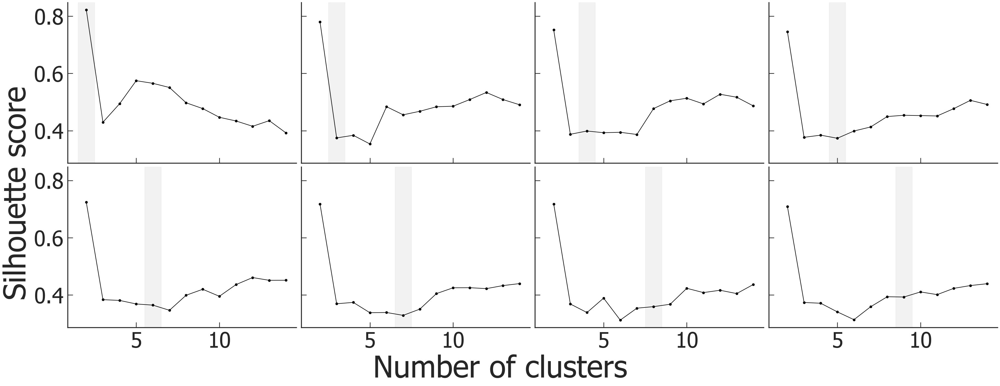

In [136]:
nc = 4
nr = 2
fig, axs = plt.subplots(nr, nc, figsize=plots.stdfigsize(nx=nc, ny=nr), constrained_layout=True, sharex=True, sharey=True)

for i in range(nr*nc):
    axs[i//nc, i%nc].plot(np.arange(2,len(sls[i])+2), sls[i], marker='o', color='k')
    axs[i//nc, i%nc].axvspan(i+1.5,i+2.5, color='gray', alpha=0.1)
    axs[i//nc, i%nc].tick_params(axis='both', which='major', labelsize=56)

fig.supxlabel('Number of clusters', ha='center', fontsize=80)
fig.supylabel('Silhouette score', va='center', fontsize=80)
plt.show()

In [137]:
n_cmp = 2
cc = dps[f1].sort_values('rd', ascending=False).iloc[:n_cmp*101,3:7].drop_duplicates()
kms = KMeans(n_clusters=n_cmp, random_state=0, n_init=5).fit(cc.values)

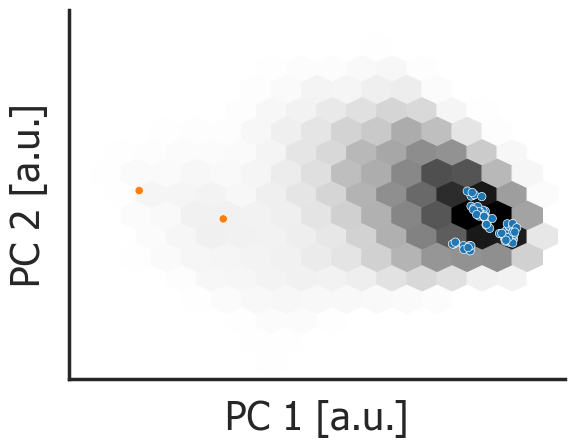

In [138]:
f1 = dps.feature_set == 'sofs+vtls'
f2 = dps.boot=='4PC'
# plt.figure(figsize=plots.stdfigsize(nx=1, ratio=1))
plt.hexbin(dps[f1 & f2].loc[:,'PC1'], dps[f1 & f2].loc[:,'PC2'], cmap='gray_r', zorder=1, gridsize=15)
sns.scatterplot(data=cc, x='PC1', y='PC2', hue=kms.labels_, zorder=2, legend=False, palette='tab10')
plt.xticks([])
plt.yticks([])
plt.xlabel('PC 1 [a.u.]')
plt.ylabel('PC 2 [a.u.]')
plt.show()

In [139]:
f1 = dps.feature_set == 'sofs+vtls+dmos'
f2 = dps.boot == '5PC'
sls = []
for n_cmp in np.arange(2,15):
    cc = dps[f1].sort_values('rd', ascending=False).iloc[:n_cmp*101, :][[f'PC{i+1}' for i in range(5)]]
    cc = cc.drop_duplicates()
    kms = [KMeans(n_clusters=nn, random_state=0, n_init=5).fit(cc.values) for nn in np.arange(2,min(15, len(cc)))]
    sls.append([silhouette_score(cc, km.labels_) for km in kms])
    # break

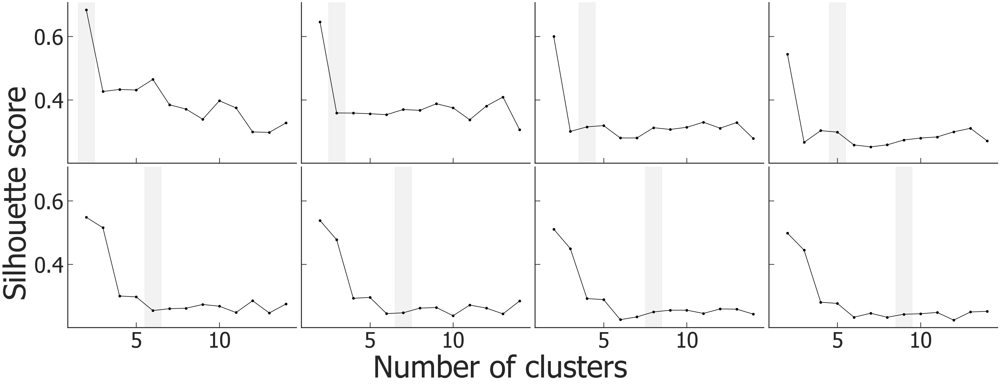

In [140]:
nc = 4
nr = 2
fig, axs = plt.subplots(nr, nc, figsize=plots.stdfigsize(nx=nc, ny=nr), constrained_layout=True, sharex=True, sharey=True)

for i in range(nr*nc):
    axs[i//nc, i%nc].plot(np.arange(2,len(sls[i])+2), sls[i], marker='o', color='k')
    axs[i//nc, i%nc].axvspan(i+1.5,i+2.5, color='gray', alpha=0.1)
    axs[i//nc, i%nc].tick_params(axis='both', which='major', labelsize=56)

fig.supxlabel('Number of clusters', ha='center', fontsize=80)
fig.supylabel('Silhouette score', va='center', fontsize=80)
plt.show()

In [141]:
n_cmp = 2
cc = dps[f1].sort_values('rd', ascending=False).iloc[:n_cmp*101,:][[f'PC{i+1}' for i in range(5)]].drop_duplicates()
kms = KMeans(n_clusters=n_cmp, random_state=0, n_init=5).fit(cc.values)

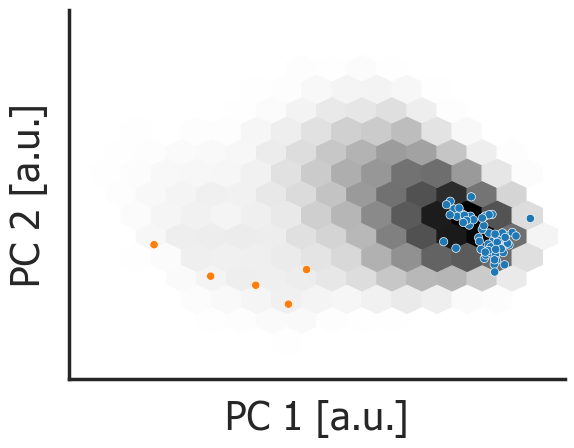

In [142]:
f1 = dps.feature_set == 'sofs+vtls+dmos'
f2 = dps.boot=='5PC'
# plt.figure(figsize=plots.stdfigsize(nx=1, ratio=1))
plt.hexbin(dps[f1 & f2].loc[:,'PC1'], dps[f1 & f2].loc[:,'PC2'], cmap='gray_r', zorder=1, gridsize=15)
sns.scatterplot(data=cc, x='PC1', y='PC2', hue=kms.labels_, zorder=2, legend=False, palette='tab10')
plt.xticks([])
plt.yticks([])
plt.xlabel('PC 1 [a.u.]')
plt.ylabel('PC 2 [a.u.]')
plt.show()

### comparison

In [143]:
def edpc(dps, feature_set, n_cmp, n_pc, se=99, gm=None):
    f1 = dps.feature_set==feature_set
    f2 = dps.boot.isin(['all', f'{n_pc}PC'])
    f3 = dps.n_pc == str(n_pc)
    cc = dps[f1&f3].sort_values('rd', ascending=False).iloc[:n_cmp*101][[f'PC{i}' for i in range(1,n_pc+1)]]
    cc = cc.drop_duplicates()
    km = KMeans(n_clusters=n_cmp, random_state=0, n_init=5).fit(cc.values)
    if gm is None:
        gm = GaussianMixture(n_components=n_cmp, means_init=km.cluster_centers_, fix_means=True, random_state=se).fit(dps.loc[f1&f2&f3, [f'PC{i}' for i in range(1,n_pc+1)]])   
        gm_pred = gm.predict(dps.loc[f1&f2&f3, [f'PC{i}' for i in range(1,n_pc+1)]])
        gm_scr = gm.score_samples(dps.loc[f1&f2&f3, [f'PC{i}' for i in range(1,n_pc+1)]])
        dps.loc[f1&f2&f3, f'{feature_set}_pred'] = gm_pred
        dps.loc[f1&f2&f3, f'{feature_set}_scr'] = gm_scr
    else:
        gm_pred = gm.predict(dps.loc[f1&f2&f3, [f'PC{i}' for i in range(1,n_pc+1)]])
        gm_scr = gm.score_samples(dps.loc[f1&f2&f3, [f'PC{i}' for i in range(1,n_pc+1)]])
        dps.loc[f1&f2&f3, f'{feature_set}_script_pred'] = gm_pred
        dps.loc[f1&f2&f3, f'{feature_set}_script_scr'] = gm_scr
    return dps, gm

In [144]:
out, gm_mimic_sofs = edpc(dps, 'sofs', 2, 2)
out, gm_mimic_sofs_vtls = edpc(out, 'sofs+vtls', 2, 4)
out, gm_mimic_sofs_vtls_dmos1 = edpc(out, 'sofs+vtls+dmos', 2, 5)
out, _ = edpc(out, 'sofs+vtls', 4, 4, gm=gm_script_sofs_vtls)

In [145]:
out = out[out.boot.isin(['2PC', '4PC', '5PC'])][list(out.columns[:3]) + list(out.columns[18:])]

In [146]:
out = out[['subject_id', 'stay_id', 'icu_day', 'sofs_pred', 'sofs_scr']].dropna().merge(
    out[['subject_id', 'stay_id', 'icu_day', 'sofs+vtls_pred', 'sofs+vtls_scr']].dropna(), how='outer').merge(
    out[['subject_id', 'stay_id', 'icu_day', 'sofs+vtls+dmos_pred', 'sofs+vtls+dmos_scr']].dropna(), how='outer').merge(
    out[['subject_id', 'stay_id', 'icu_day', 'sofs+vtls_script_pred', 'sofs+vtls_script_scr']].dropna(), how='outer')

In [147]:
mimic = pd.read_csv(os.path.join(mimic_dir, 'data.csv'), index_col=0)
mimic_edps = pd.read_csv(os.path.join(curated_dir, 'mimic_edps.csv'), index_col=0)
mimic = mimic.merge(mimic_edps, how='left')
mimic['edps'] = np.nan
mimic['edps'] = mimic['edps'].astype('object')
f1 = abs(mimic.Itv)<1
f2 = mimic.discharge=='Died'
f3 = mimic.icu_day>=mimic.los_icu
mimic.loc[f1&f2&f3, 'edps'] = 'dying'
f1 = mimic.los_icu - mimic.icu_day + mimic.Itv<=10
f2 = mimic.discharge=='Recovered'
f3 = (mimic.los_icu-mimic.icu_day)/mimic.los_icu <=.2
mimic.loc[f1&f2&f3, 'edps'] = 'home'

In [148]:
out = out.merge(mimic, how='left', on=['subject_id', 'stay_id', 'icu_day'])

In [149]:
out = out.sort_values(['subject_id', 'stay_id', 'icu_day'])

In [150]:
pred_cols = [i for i in out.columns if 'pred' in i]
for i in pred_cols:
    tmp = (out[out['edps'] == 'dying'].groupby(i).size() / out.groupby(i).size()).reset_index(name='mortality_24h').fillna(0).sort_values('mortality_24h')
    mapping = {cluster: f'C{j+1}' for j, cluster in enumerate(tmp[i])}
    print(mapping, '\n', i)
    out[i] = out[i].map(mapping)

{1.0: 'C1', 0.0: 'C2'} 
 sofs_pred
{0.0: 'C1', 1.0: 'C2'} 
 sofs+vtls_pred
{0.0: 'C1', 1.0: 'C2'} 
 sofs+vtls+dmos_pred
{0.0: 'C1', 2.0: 'C2', 4.0: 'C3', 3.0: 'C4', 1.0: 'C5'} 
 sofs+vtls_script_pred


In [151]:
out_mimic = out.copy()

In [152]:
out_mimic['days_to_discharge'] = np.where(
    out_mimic['Itv'].notna(),
    out_mimic['los_icu'] - out_mimic['icu_day'] + out_mimic['Itv'],
    np.nan
)

In [153]:
mors = []
tmp = out_mimic.copy()
for ff in ['sofs', 'sofs+vtls', 'sofs+vtls+dmos', 'sofs+vtls_script']:
    for dd in [1,2,4,8,16,'all']:
        f1 = tmp.discharge=='Died'
        f2 = tmp.days_to_discharge<dd if dd!='all' else tmp.days_to_discharge.notna()
        mor = tmp[f1&f2].groupby(f'{ff}_pred', observed=False).size() / tmp.groupby(f'{ff}_pred', observed=False).size()
        mors.append(pd.DataFrame({
            'mortality': mor.fillna(0).values,
            'cluster': mor.index,
            'feature': ff,
            'days': str(dd)
        }))

In [154]:
mor = pd.concat(mors, ignore_index=True)
mor['mortality'] = mor['mortality'] * 100

In [155]:
entropy_values = mor.groupby(['days', 'feature']).apply(lambda x: entropy(x['mortality'])/np.log(len(x)), include_groups=False).reset_index()
entropy_values.columns = ['days', 'feature', 'entropy']

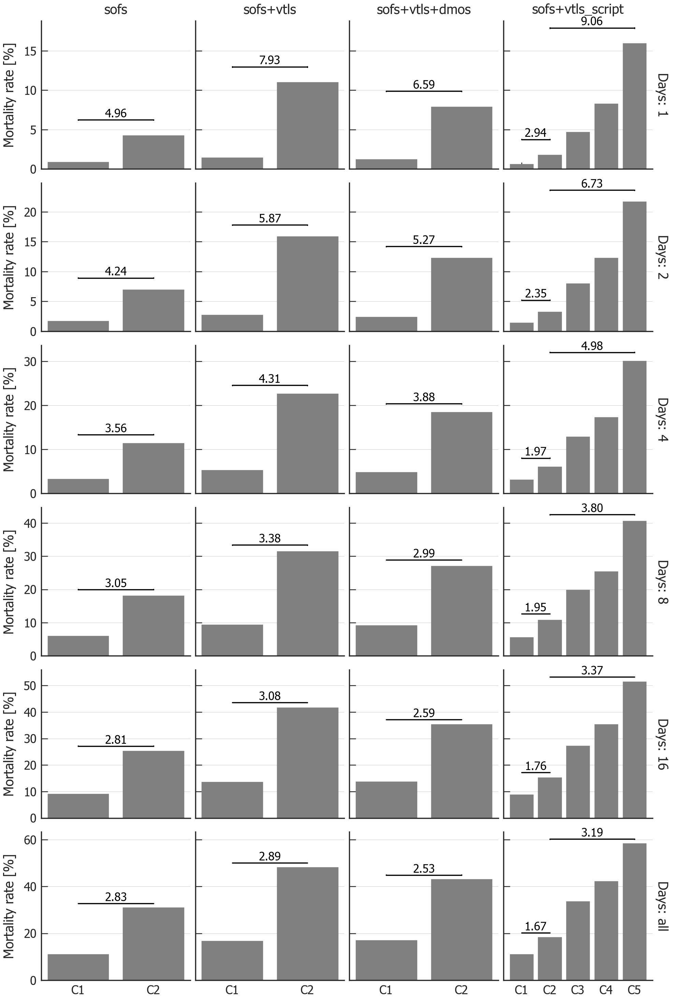

In [156]:
g = sns.catplot(
    data=mor, 
    row='days', 
    y='mortality', 
    x='cluster', 
    col='feature', 
    kind='bar', 
    errorbar=None,
    sharey='row', 
    sharex='col',
    margin_titles=True,
    color='gray',
    linewidth=2.5, edgecolor=".5"

)

# Add entropy values as text annotations
# for (row_val, col_val), ax in np.ndenumerate(g.axes):
#     nday = g.row_names[row_val]
#     feature_set = g.col_names[col_val]
#     entropy_value = entropy_values[(entropy_values['days'] == nday) & (entropy_values['feature'] == feature_set)]['entropy'].values[0]
#     ax.text(0.4, 0.8, f'Entropy: {entropy_value:.2f}', transform=ax.transAxes, ha='center', fontsize=28)
# Iterate over each axis to add fold change annotations

for (row_val, col_val), ax in g.axes_dict.items():
    ax.set_title('')
    ax.grid(axis='y')
    
    # Extract the data corresponding to this specific panel
    data = mor[
        (mor['days'] == row_val) &
        (mor['feature'] == col_val)
    ]
    
    if col_val == 'sofs+vtls_script':
        c1 = data.loc[data['cluster'] == 'C1', 'mortality'].values
        c2 = data.loc[data['cluster'] == 'C2', 'mortality'].values
        c5 = data.loc[data['cluster'] == 'C5', 'mortality'].values
        
        # Draw line and annotate fold change C2/C1 with vertical caps
        if len(c1) > 0 and len(c2) > 0:
            fold_change_c2_c1 = c2 / c1
            y_max_c1_c2 = max(max(c1), max(c2))
            line_y = y_max_c1_c2 + 2
            ax.plot([0, 1], [line_y, line_y], color='black', linewidth=2.5)
            ax.plot([0, 0], [line_y - 0.03, line_y + 0.03], color='black', linewidth=2.5)  # Left vertical cap
            ax.plot([1, 1], [line_y - 0.03, line_y + 0.03], color='black', linewidth=2.5)  # Right vertical cap
            ax.annotate(f'{fold_change_c2_c1[0]:.2f}', xy=(0.5, line_y + 0.04), xycoords='data',
                        ha='center', va='bottom', fontsize=24, color='black')

        # Draw line and annotate fold change C5/C2 with vertical caps
        if len(c2) > 0 and len(c5) > 0:
            fold_change_c5_c2 = c5 / c2
            y_max_c2_c5 = max(max(c2), max(c5))
            line_y = y_max_c2_c5 + 2
            ax.plot([1, 4], [line_y, line_y], color='black', linewidth=2.5)
            ax.plot([1, 1], [line_y - 0.03, line_y + 0.03], color='black', linewidth=2.5)  # Left vertical cap
            ax.plot([4, 4], [line_y - 0.03, line_y + 0.03], color='black', linewidth=2.5)  # Right vertical cap
            ax.annotate(f'{fold_change_c5_c2[0]:.2f}', xy=(2.5, line_y + 0.04), xycoords='data',
                        ha='center', va='bottom', fontsize=24, color='black')
            
    else:
        c1 = data.loc[data['cluster'] == 'C1', 'mortality'].values
        c2 = data.loc[data['cluster'] == 'C2', 'mortality'].values
        
        if len(c1) > 0 and len(c2) > 0:
            fold_change_c2_c1 = c2 / c1
            y_max_c1_c2 = max(max(c1), max(c2))
            line_y = y_max_c1_c2 + 2
            ax.plot([0, 1], [line_y, line_y], color='black', linewidth=2.5)
            ax.plot([0, 0], [line_y - 0.03, line_y + 0.03], color='black', linewidth=2.5)  # Left vertical cap
            ax.plot([1, 1], [line_y - 0.03, line_y + 0.03], color='black', linewidth=2.5)  # Right vertical cap
            ax.annotate(f'{fold_change_c2_c1[0]:.2f}', xy=(0.5, line_y + 0.04), xycoords='data',
                        ha='center', va='bottom', fontsize=24, color='black')

        
g.set_titles(row_template='Days: {row_name}', col_template='{col_name}')
g.set_axis_labels('', 'Mortality rate [%]')


plt.show()

In [157]:
mors = []
for ff in ['sofs', 'sofs+vtls', 'sofs+vtls+dmos', 'sofs+vtls_script']:
    tmp = out.copy()
    mor = (tmp[tmp['edps'] == 'dying'].groupby(f'{ff}_pred').size() / tmp.groupby(f'{ff}_pred').size()).reset_index(name='mortality_1d').fillna(0).sort_values('mortality_1d')
    for dd in [2,4,8,16]:
        tmp = out.copy()
        tmp['edps'] = tmp.groupby(['subject_id', 'stay_id']).edps.bfill(limit=(dd-1))
        mor = mor.merge((tmp[tmp['edps'] == 'dying'].groupby(f'{ff}_pred').size() / tmp.groupby(f'{ff}_pred').size()).reset_index(name=f'mortality_{dd}d').fillna(0).sort_values(f'mortality_{dd}d'), on=f'{ff}_pred')
    tmp = out.copy()
    tmp['edps'] = tmp.groupby(['subject_id', 'stay_id']).edps.bfill()
    mor = mor.merge((tmp[tmp['edps'] == 'dying'].groupby(f'{ff}_pred').size() / tmp.groupby(f'{ff}_pred').size()).reset_index(name=f'mortality_all').fillna(0).sort_values(f'mortality_all'), on=f'{ff}_pred')

    mor['feature_set'] = ff
    mor = mor.rename(columns={f'{ff}_pred': 'cluster'})
    mors.append(mor)

In [158]:
mor = pd.concat(mors)
mor = mor.melt(id_vars=['feature_set', 'cluster'], var_name='Nday', value_name='mortality')
mor['mortality'] = mor['mortality'] * 100

In [159]:
entropy_values = mor.groupby(['Nday', 'feature_set']).apply(lambda x: entropy(x['mortality'])/np.log(len(x)), include_groups=False).reset_index()
entropy_values.columns = ['Nday', 'feature_set', 'entropy']

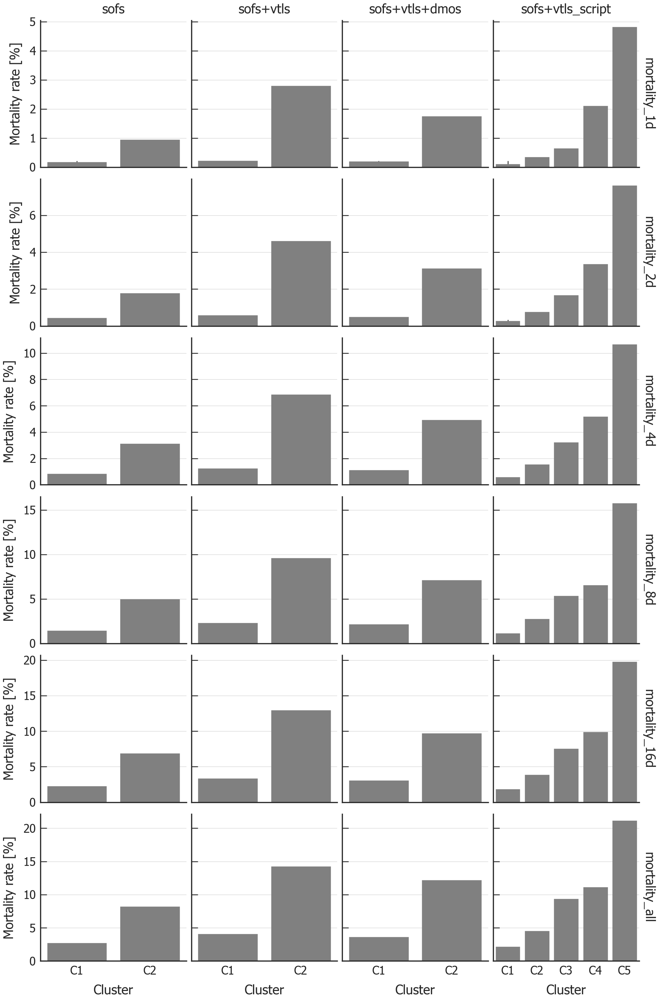

In [160]:
g = sns.catplot(
    data=mor, 
    row='Nday', 
    y='mortality', 
    x='cluster', 
    col='feature_set', 
    kind='bar', 
    errorbar=None,
    sharey='row', 
    sharex='col',
    margin_titles=True,
    color='gray',
    linewidth=2.5, edgecolor=".5"

)

for ax in g.axes.flat:
    ax.set_title('')
    ax.grid(axis='y')

# Add entropy values as text annotations
# for (row_val, col_val), ax in np.ndenumerate(g.axes):
#     nday = g.row_names[row_val]
#     feature_set = g.col_names[col_val]
#     entropy_value = entropy_values[(entropy_values['Nday'] == nday) & (entropy_values['feature_set'] == feature_set)]['entropy'].values[0]
#     ax.text(0.4, 0.8, f'Entropy: {entropy_value:.2f}', transform=ax.transAxes, ha='center', fontsize=28)

g.set_titles(row_template='{row_name}', col_template='{col_name}')
g.set_axis_labels('Cluster', 'Mortality rate [%]')


plt.show()

# script vs. mimic

## sofs+vtls

In [161]:
mimic, _ = load_and_prepare_dataset(dataset='mimic', feature_set='sofs+vtls', \
                                imputation_strategy='Complete_cases', scaler_name='Raw', holdout=.5)

carpediem, _ = load_and_prepare_dataset(dataset='carpediem', feature_set='sofs+vtls', \
                                imputation_strategy='CarryLastForward_limit2', scaler_name='Raw', holdout=.1)

In [162]:
mapping_dict = {
    'respiration_24hours': 'P_F_ratio_points',
    'coagulation_24hours': 'platelet_points',
    'liver_24hours': 'bilirubin_points',
    'cardiovascular_24hours': 'htn_points',
    'gcs_motor': 'GCS_motor_response',
    'gcs_verbal': 'GCS_verbal_response',
    'gcs_eyes': 'GCS_eye_opening',
    'renal_24hours': 'renal_points',
    'heart_rate': 'Heart_rate',
    'sbp': 'Systolic_blood_pressure',
    'dbp': 'Diastolic_blood_pressure',
    'mbp': 'Mean_arterial_pressure',
    'resp_rate': 'Respiratory_rate',
    'temperature': 'Temperature',
    'spo2': 'Oxygen_saturation'
}

In [163]:
mimic = mimic.rename(columns=mapping_dict)[carpediem.columns]

In [164]:
scaler = KBinsDiscretizer(n_bins=5, encode="ordinal", strategy='quantile')
scaler.fit(carpediem.iloc[:, 8:-1])
carpediem.iloc[:, 8:-1] = scaler.transform(carpediem.iloc[:, 8:-1])
mimic.iloc[:, 8:-1] = scaler.transform(mimic.iloc[:, 8:-1])

In [165]:
pcaX_carpediem, pca_carpediem, loadings_carpediem, top_features_carpediem = perform_pca(data=carpediem.iloc[:,:-1], n_components=carpediem.shape[1]-1, plot=False)

In [166]:
Carpediem_fit_pca_transform_mimic = pca_carpediem.transform(mimic[carpediem.columns].iloc[:,:-1])
Carpediem_fit_pca_transform_mimic = pd.DataFrame(Carpediem_fit_pca_transform_mimic, columns=[f'PC{i}' for i in np.arange(1,carpediem.shape[1])], index=mimic.index)

In [167]:
Carpediem_fit_pca_transform_mimic['dataset'] = 'MIMIC'
pcaX_carpediem['dataset'] = 'SCRIPT'

combined_script_pca = pd.concat([Carpediem_fit_pca_transform_mimic, pcaX_carpediem])

[]

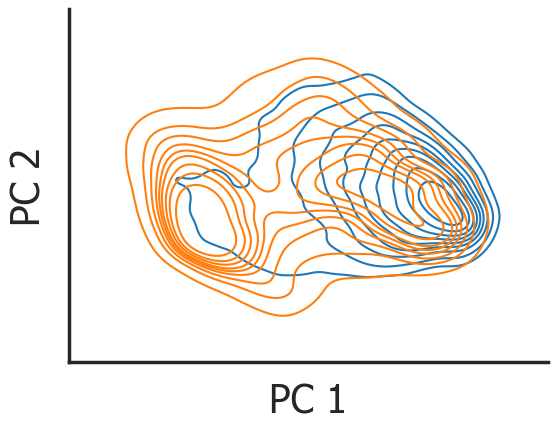

In [168]:
fig = plt.figure(constrained_layout=True, figsize=plots.stdfigsize(nx=1, ny=1, scale=0.6))
sns.kdeplot(data=combined_script_pca, x='PC1', y='PC2', hue='dataset', fill=False, common_norm=False, legend=False)
fig.gca().set_xlabel('PC 1')
fig.gca().set_ylabel('PC 2')
fig.gca().set_xticks([])
fig.gca().set_yticks([])
# sns.move_legend(fig.gca(), 'best', frameon=False, title='', labels=['MIMIC', 'SCRIPT'])

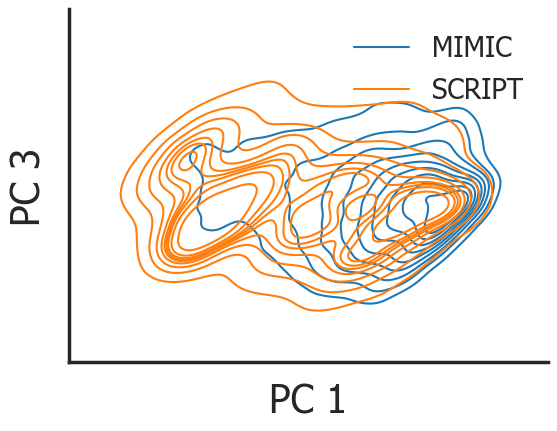

In [169]:
fig = plt.figure(constrained_layout=True, figsize=plots.stdfigsize(nx=1, ny=1, scale=0.6))
sns.kdeplot(data=combined_script_pca, x='PC1', y='PC3', hue='dataset', fill=False, common_norm=False)
fig.gca().set_xlabel('PC 1')
fig.gca().set_ylabel('PC 3')
fig.gca().set_xticks([])
fig.gca().set_yticks([])
sns.move_legend(fig.gca(), 'best', frameon=False, title='', labels=['MIMIC', 'SCRIPT'])

In [170]:
def hexbin(x, y, color, **kwargs):
    cmap = sns.color_palette("coolwarm", as_cmap=True)
    plt.hexbin(x, y, gridsize=15, cmap=cmap, **kwargs)

In [171]:
def hexbin(x, y, color, **kwargs):
    cmap = sns.light_palette(color, as_cmap=True)
    plt.hexbin(x, y, gridsize=15, cmap=cmap, **kwargs)

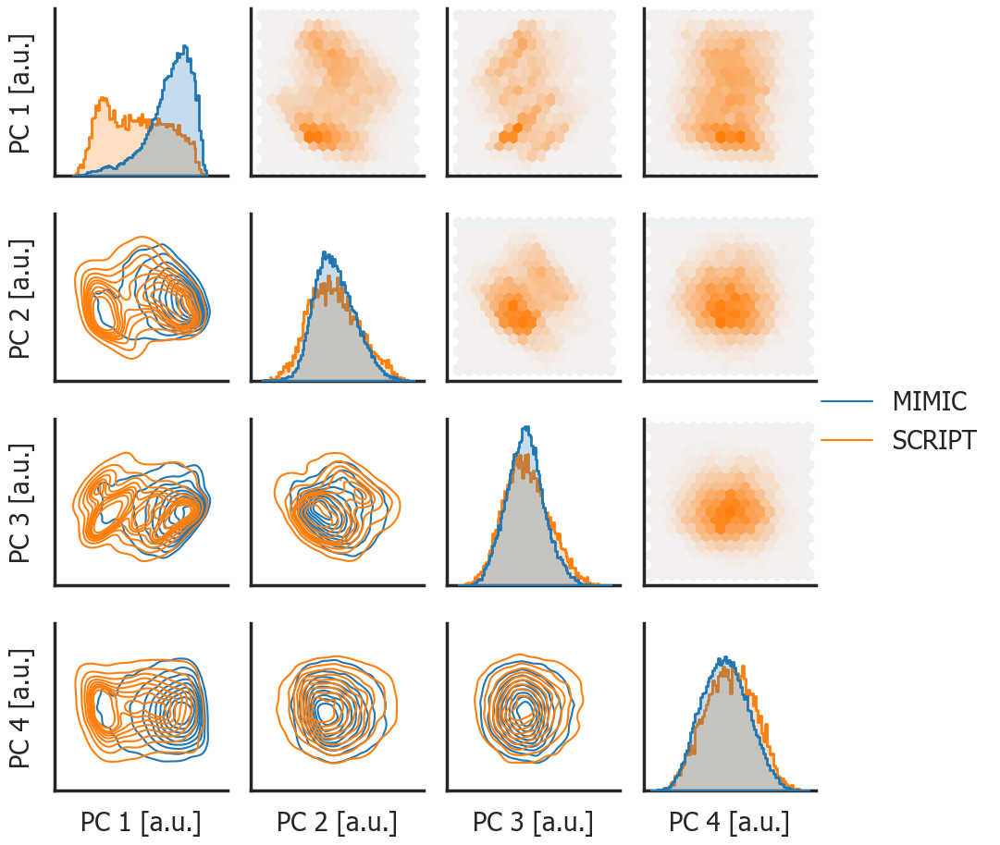

In [172]:
g = sns.PairGrid(combined_script_pca, hue='dataset', vars=['PC1', 'PC2', 'PC3', 'PC4'])
g.map_diag(sns.histplot, kde=False, stat="density", common_norm=False, element='step', linewidth=2, hue='dataset', data=combined_script_pca)
g.map_upper(hexbin)
g.map_lower(sns.kdeplot, common_norm=False, data=combined_script_pca)
g.add_legend()
g._legend.set_title("")

replacements = {
    'PC1': 'PC 1 [a.u.]', 'PC2': 'PC 2 [a.u.]', 'PC3': 'PC 3 [a.u.]', 'PC4': 'PC 4 [a.u.]'
}
for i in range(4):
    for j in range(4):
        g.axes[i][j].set_xticklabels([])
        g.axes[i][j].set_yticklabels([])
        g.axes[i][j].set_xticks([])
        g.axes[i][j].set_yticks([])
        xlabel = g.axes[i][j].get_xlabel()
        ylabel = g.axes[i][j].get_ylabel()
        if xlabel in replacements.keys():
            g.axes[i][j].set_xlabel(replacements[xlabel], fontsize=20)
        if ylabel in replacements.keys():
            g.axes[i][j].set_ylabel(replacements[ylabel], fontsize=20)

# plt.savefig("../plots/sup/240417_combined_dist_sofs+vtls.png", dpi=150, transparent=True, bbox_inches="tight")